# Example to plot map



In this example, we will plot the provided map as well as the localization results.
The map is stored as a bitmap image with a specific pixel-per-meter scale.

In [60]:
from PIL import Image
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [61]:
dataname = "1"

bitmap_filename = "map/miraikan_5.bmp"
traj_filename = f"ground_truth/{dataname}.csv"

### Data load

Load the bitmap and scale to 0-1. Also define specs of the map


In [62]:
bitmap_array = np.array(Image.open(bitmap_filename))/255.0

map_origin=(-5.625, -12.75)
map_ppm = 100 # pixels per meter

Load a ground-truth data to plot. It contains location and orientation. As we are gonig to use yaw angle (rotation around z axis), we also convert the quaternins to yaw angles.

In [63]:
def quaternion_to_yaw(qw, qx, qy, qz):
    return np.arctan2(2.0 * (qw * qz + qx * qy), 1.0 - 2.0 * (qy * qy + qz * qz))

df_gt = pd.read_csv(traj_filename, header=0).astype(float)

display(df_gt)

df_gt['yaw'] = quaternion_to_yaw(df_gt['qw'], df_gt['qx'], df_gt['qy'], df_gt['qz'])

,timestamp,x,y,z,qw,qx,qy,qz
0,0.000,41.908298,-10.167844,1.086074,0.620845,0.391461,0.451081,0.507776
1,0.067,41.894479,-10.144016,1.089935,0.625199,0.377639,0.443265,0.519645
2,0.167,41.894543,-10.146287,1.088108,0.621363,0.378608,0.448350,0.519179
3,0.300,41.890515,-10.143397,1.097090,0.613394,0.384823,0.446430,0.525699
4,0.434,41.891810,-10.136658,1.095929,0.617561,0.381556,0.446253,0.523347
...,...,...,...,...,...,...,...,...
6268,826.925,41.449481,-10.043877,1.089705,0.722649,0.584273,-0.144962,-0.339689
6269,827.025,41.489190,-10.073789,1.080488,0.716057,0.602505,-0.099877,-0.338045
6270,827.092,41.423673,-9.999193,1.062517,0.720921,0.595851,-0.113906,-0.335052
6271,827.192,41.424420,-10.007831,1.068319,0.718073,0.599907,-0.118537,-0.332313


### Plot trajectory

Let's plot them together.

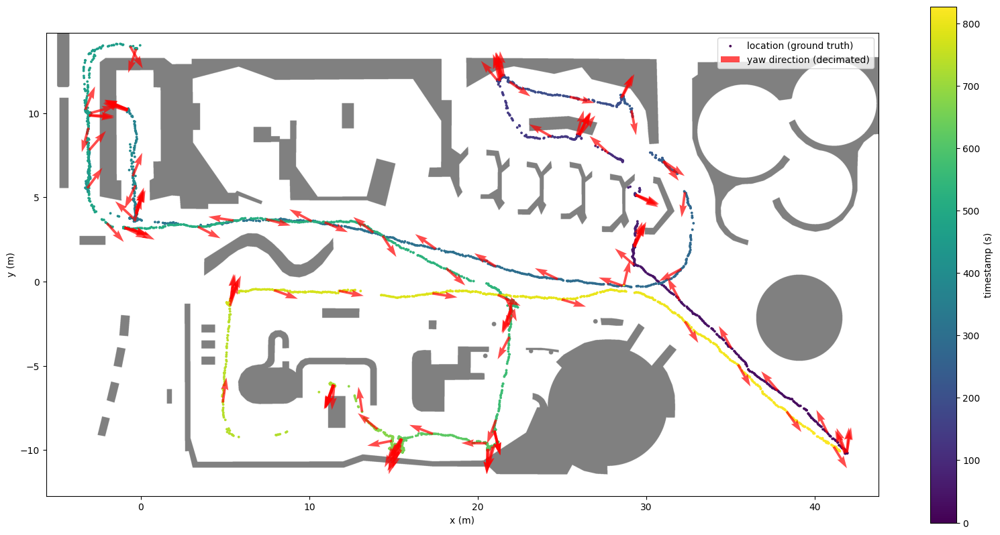

In [64]:
def plot_map(ax, bitmap, map_origin, map_ppm):
    height, width = bitmap.shape[:2]
    
    # Calculate extent in meters
    width_m = width / map_ppm
    height_m = height / map_ppm
    
    extent = [
        map_origin[0],                    # left (x_min)
        map_origin[0] + width_m,          # right (x_max)
        map_origin[1],                    # bottom (y_min)
        map_origin[1] + height_m          # top (y_max)
    ]
    
    ax.imshow(bitmap, extent=extent, alpha=0.5, cmap='gray')
    
    
def plot_yaw(ax, df_gt, decimation_rate=1):
    decimated_df = df_gt.iloc[::decimation_rate]
    arrow_length = 1.5
    dx = arrow_length * np.cos(decimated_df.yaw)
    dy = arrow_length * np.sin(decimated_df.yaw)

    ax.quiver(decimated_df.x, decimated_df.y, dx, dy, 
            angles='xy', scale_units='xy', scale=1, 
            color='red', alpha=0.7, width=0.003, label="yaw direction (decimated)")
    
    
fig, ax = plt.subplots(1,1,figsize=(20, 10))
plot_map(ax, bitmap_array, map_origin, map_ppm)

scatter = ax.scatter(df_gt.x, df_gt.y, c=df_gt.timestamp, s=3, label="location (ground truth)")

plot_yaw(ax, df_gt, decimation_rate=50)

ax.set_xlabel("x (m)")
ax.set_ylabel("y (m)")

plt.colorbar(scatter, ax=ax, label='timestamp (s)')
    
plt.legend()
plt.show()


## Plot estimated results
Following cells assume that you have done example 2-5 and have estimation in 02_realtime_sample/output/1_est.csv

Note that the estimated results does not contain 0.0 s (initial value given from the competition organizer)

In [65]:
est_filename = "02_realtime_sample/output/1_est.csv"
df_est = pd.read_csv(est_filename, header=0).astype(float)

# NLOS情報を含むUWBTデータも読み込む
uwbt_filename = "02_realtime_sample/output/uwbt.csv"
df_uwbt = pd.read_csv(uwbt_filename, header=0)

display(df_est)
print(f"\nUWBT NLOS データサンプル:")
display(df_uwbt.head())

,timestamp,x,y,yaw
0,0.501,41.4,-10.1,1.1
1,1.001,41.3,-10.0,1.0
2,1.501,41.3,-10.0,0.9
3,2.001,41.3,-10.0,1.1
4,2.501,41.3,-10.0,1.1
...,...,...,...,...
1650,825.501,41.3,-9.4,0.9
1651,826.001,41.3,-9.6,0.9
1652,826.501,41.4,-9.7,0.9
1653,827.001,41.6,-9.7,0.9



UWBT NLOS データサンプル:


,app_timestamp,sensor_timestamp,tag_id,distance,aoa_azimuth,aoa_elevation,nlos
0,0.024,0.024,3637RLJ,0.44,69.80,-72.00,0.0
1,0.076,0.076,3583WAA,0.52,-84.00,-84.62,0.0
2,0.126,0.126,3636DWF,0.75,-11.75,42.91,0.0
3,0.238,0.238,3583WAA,0.53,-84.00,-84.44,0.0
4,0.377,0.377,3637RLJ,0.42,69.77,-72.00,0.0


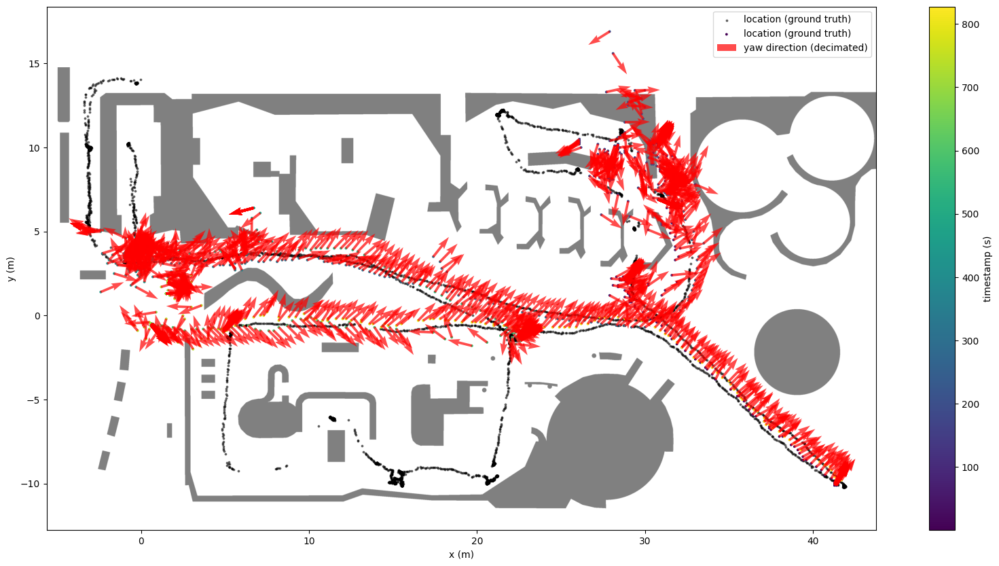

In [66]:

fig, ax = plt.subplots(1,1,figsize=(20, 10))
plot_map(ax, bitmap_array, map_origin, map_ppm)

scatter = ax.scatter(df_gt.x, df_gt.y, c="k", alpha=0.5, s=3, label="location (ground truth)")
scatter = ax.scatter(df_est.x, df_est.y, c=df_est.timestamp, s=3, label="location (ground truth)")

plot_yaw(ax, df_est, decimation_rate=1)

ax.set_xlabel("x (m)")
ax.set_ylabel("y (m)")

plt.colorbar(scatter, ax=ax, label='timestamp (s)')
    
plt.legend()
plt.show()

# 推定座標のみ表示


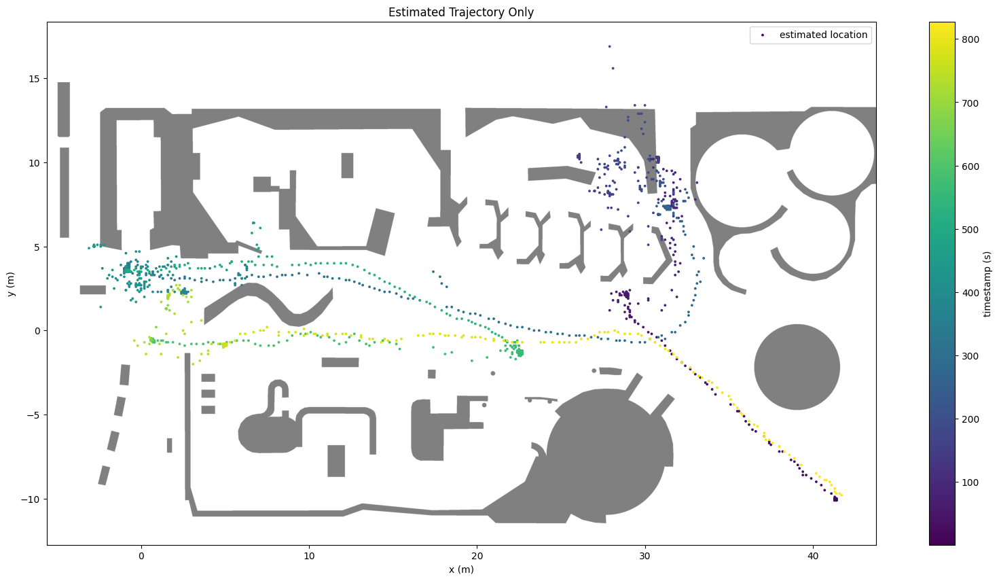

In [67]:
# 推定座標のみ表示
fig, ax = plt.subplots(1, 1, figsize=(20, 10))

# 地図を描画
plot_map(ax, bitmap_array, map_origin, map_ppm)

# 推定結果を散布図として描画
scatter_est = ax.scatter(df_est.x, df_est.y, c=df_est.timestamp, s=3, cmap='viridis', label="estimated location")

# 軸ラベルや凡例
ax.set_xlabel("x (m)")
ax.set_ylabel("y (m)")
plt.colorbar(scatter_est, ax=ax, label='timestamp (s)')
plt.legend()
plt.title("Estimated Trajectory Only")
plt.show()


# 正解と推定の重ね描画

元の推定データ数: 1655
NLOS除外後データ数: 1445
除外率: 12.7%


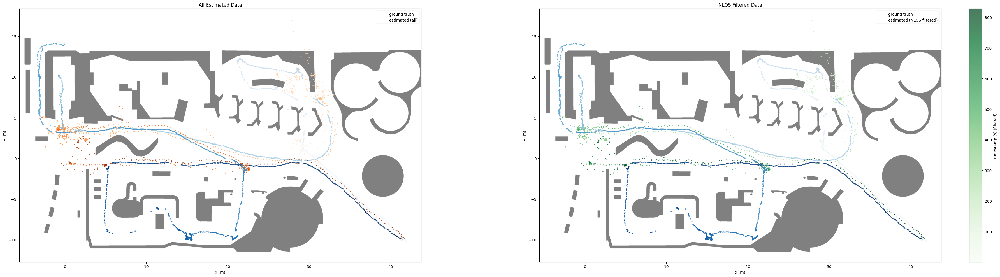

In [68]:
# NLOS除外機能付きプロット
def filter_estimates_by_nlos(df_est, df_uwbt, nlos_threshold=0.5):
    """
    UWBTのNLOS情報を使って推定結果をフィルタリング
    """
    # タイムスタンプの近いUWBTデータを探してNLOS判定
    filtered_est = []
    

    for _, est_row in df_est.iterrows():
        est_time = est_row['timestamp']
        
        # ±0.1秒以内のUWBTデータを探す
        time_mask = (df_uwbt['app_timestamp'] >= est_time - 0.1) & \
                   (df_uwbt['app_timestamp'] <= est_time + 0.1)
        nearby_uwbt = df_uwbt[time_mask]
        
        # NLOS判定：近い時間のUWBTデータでNLOSが多い場合は除外
        if len(nearby_uwbt) > 0:
            nlos_ratio = (nearby_uwbt['nlos'] > nlos_threshold).mean()
            if nlos_ratio < 0.5:  # 50%未満がNLOSなら使用
                filtered_est.append(est_row)
        else:
            # UWBTデータがない場合は保持
            filtered_est.append(est_row)

            
    
    return pd.DataFrame(filtered_est)

# NLOS除外フィルタリング
df_est_filtered = filter_estimates_by_nlos(df_est, df_uwbt)

print(f"元の推定データ数: {len(df_est)}")
print(f"NLOS除外後データ数: {len(df_est_filtered)}")
print(f"除外率: {(1 - len(df_est_filtered)/len(df_est))*100:.1f}%")

# 正解と推定の重ね描画（NLOS除外版）
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40, 10))

# 左側：全データ
plot_map(ax1, bitmap_array, map_origin, map_ppm)
scatter_gt1 = ax1.scatter(df_gt.x, df_gt.y, c=df_gt.timestamp, s=3, cmap='Blues', alpha=0.7, label="ground truth")
scatter_est1 = ax1.scatter(df_est.x, df_est.y, c=df_est.timestamp, s=3, cmap='Oranges', alpha=0.7, label="estimated (all)")
ax1.set_xlabel("x (m)")
ax1.set_ylabel("y (m)")
ax1.legend()
ax1.set_title("All Estimated Data")

# 右側：NLOS除外後
plot_map(ax2, bitmap_array, map_origin, map_ppm)
scatter_gt2 = ax2.scatter(df_gt.x, df_gt.y, c=df_gt.timestamp, s=3, cmap='Blues', alpha=0.7, label="ground truth")
if len(df_est_filtered) > 0:
    scatter_est2 = ax2.scatter(df_est_filtered.x, df_est_filtered.y, c=df_est_filtered.timestamp, s=3, cmap='Greens', alpha=0.7, label="estimated (NLOS filtered)")
    plt.colorbar(scatter_est2, ax=ax2, label='timestamp (s) (filtered)')
ax2.set_xlabel("x (m)")
ax2.set_ylabel("y (m)")
ax2.legend()
ax2.set_title("NLOS Filtered Data")

plt.tight_layout()
plt.show()

LOS推定データ数: 609
NLOS推定データ数: 128
混在/不明データ数: 918


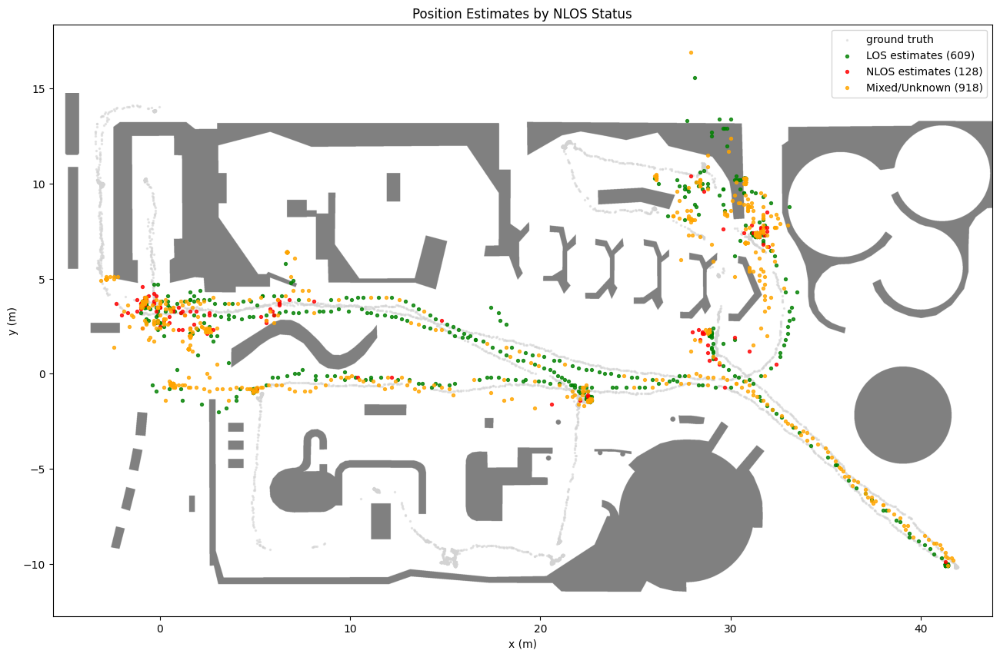


=== 精度統計 ===
LOS推定:
  平均誤差: 1.997m
  中央値誤差: 0.656m
  標準偏差: 2.766m
  95%タイル誤差: 7.898m
NLOS推定:
  平均誤差: 3.295m
  中央値誤差: 1.894m
  標準偏差: 3.144m
  95%タイル誤差: 9.581m
混在推定:
  平均誤差: 8.367m
  中央値誤差: 7.011m
  標準偏差: 6.593m
  95%タイル誤差: 20.783m


In [69]:
# NLOS/LOS区別詳細表示
def categorize_estimates_by_nlos(df_est, df_uwbt, nlos_threshold=0.5):
    """
    推定結果をNLOS状態別に分類
    """
    los_est = []
    nlos_est = []
    unknown_est = []
    
    for _, est_row in df_est.iterrows():
        est_time = est_row['timestamp']
        
        # ±0.1秒以内のUWBTデータを探す
        time_mask = (df_uwbt['app_timestamp'] >= est_time - 0.1) & \
                   (df_uwbt['app_timestamp'] <= est_time + 0.1)
        nearby_uwbt = df_uwbt[time_mask]
        
        if len(nearby_uwbt) > 0:
            nlos_ratio = (nearby_uwbt['nlos'] > nlos_threshold).mean()
            if nlos_ratio < 0.3:
                los_est.append(est_row)
            elif nlos_ratio > 0.7:
                nlos_est.append(est_row)
            else:
                unknown_est.append(est_row)  # 混在状態
        else:
            unknown_est.append(est_row)
    
    return pd.DataFrame(los_est), pd.DataFrame(nlos_est), pd.DataFrame(unknown_est)

# NLOS状態別分類
df_los, df_nlos, df_mixed = categorize_estimates_by_nlos(df_est, df_uwbt)

print(f"LOS推定データ数: {len(df_los)}")  
print(f"NLOS推定データ数: {len(df_nlos)}")
print(f"混在/不明データ数: {len(df_mixed)}")

# NLOS/LOS区別表示
fig, ax = plt.subplots(1, 1, figsize=(20, 10))

# 地図を描画
plot_map(ax, bitmap_array, map_origin, map_ppm)

# 正解軌跡（薄いグレー）
ax.scatter(df_gt.x, df_gt.y, c='lightgray', s=2, alpha=0.5, label="ground truth")

# NLOS状態別の推定結果
if len(df_los) > 0:
    ax.scatter(df_los.x, df_los.y, c='green', s=8, alpha=0.8, label=f"LOS estimates ({len(df_los)})")
if len(df_nlos) > 0:
    ax.scatter(df_nlos.x, df_nlos.y, c='red', s=8, alpha=0.8, label=f"NLOS estimates ({len(df_nlos)})")
if len(df_mixed) > 0:
    ax.scatter(df_mixed.x, df_mixed.y, c='orange', s=8, alpha=0.8, label=f"Mixed/Unknown ({len(df_mixed)})")

ax.set_xlabel("x (m)")
ax.set_ylabel("y (m)")
ax.legend()
ax.set_title("Position Estimates by NLOS Status")
plt.show()

# 精度統計の計算
def calculate_accuracy_stats(df_est_subset, df_gt, name):
    if len(df_est_subset) == 0:
        print(f"{name}: データなし")
        return
    
    # 最も近い正解点との距離を計算
    errors = []
    for _, est_row in df_est_subset.iterrows():
        est_time = est_row['timestamp']
        # 最も近い時間の正解データを探す
        time_diffs = np.abs(df_gt['timestamp'] - est_time)
        closest_idx = time_diffs.idxmin()
        closest_gt = df_gt.loc[closest_idx]
        
        error = np.sqrt((est_row['x'] - closest_gt['x'])**2 + 
                       (est_row['y'] - closest_gt['y'])**2)
        errors.append(error)
    
    errors = np.array(errors)
    print(f"{name}:")
    print(f"  平均誤差: {np.mean(errors):.3f}m")
    print(f"  中央値誤差: {np.median(errors):.3f}m")
    print(f"  標準偏差: {np.std(errors):.3f}m")
    print(f"  95%タイル誤差: {np.percentile(errors, 95):.3f}m")

print("\n=== 精度統計 ===")
calculate_accuracy_stats(df_los, df_gt, "LOS推定")
calculate_accuracy_stats(df_nlos, df_gt, "NLOS推定")
calculate_accuracy_stats(df_mixed, df_gt, "混在推定")

# 各タグごとの位置推定プロット

In [70]:
# 各タグごとの推定結果を模擬するサンプルデータ生成
import numpy as np

# 位置推定機能をデモンストレーションするためのサンプルデータ
def generate_per_tag_sample_data():
    """
    各タグごとの位置推定をデモするためのサンプルデータを生成
    """
    # 基準軌跡（ground truth）
    base_trajectory = df_gt[['timestamp', 'x', 'y']].copy()
    
    # 3つのタグからの推定をシミュレート
    tags = ['3637RLJ', '3583WAA', '3636DWF']
    tag_colors = ['red', 'blue', 'green']
    
    tag_estimates = {}
    
    for i, tag_id in enumerate(tags):
        # 各タグで異なる誤差特性を持つ推定結果を生成
        estimates = []
        
        for _, row in base_trajectory.iterrows():
            if np.random.random() > 0.1:  # 90%の確率でデータあり
                # タグごとに異なる誤差を追加
                noise_level = [0.5, 0.8, 0.3][i]  # タグごとの精度差
                bias_x = [0.2, -0.3, 0.1][i]  # タグごとのバイアス
                bias_y = [-0.1, 0.2, -0.2][i]
                
                est_x = row['x'] + np.random.normal(bias_x, noise_level)
                est_y = row['y'] + np.random.normal(bias_y, noise_level)
                
                estimates.append({
                    'timestamp': row['timestamp'],
                    'x': est_x,
                    'y': est_y,
                    'tag_id': tag_id
                })
        
        tag_estimates[tag_id] = pd.DataFrame(estimates)
    
    return tag_estimates, tags, tag_colors

# サンプルデータ生成
tag_estimates, tags, tag_colors = generate_per_tag_sample_data()

# 各タグの推定データ数を表示
for tag_id in tags:
    print(f"Tag {tag_id}: {len(tag_estimates[tag_id])} estimates")

Tag 3637RLJ: 5607 estimates
Tag 3583WAA: 5634 estimates
Tag 3636DWF: 5667 estimates


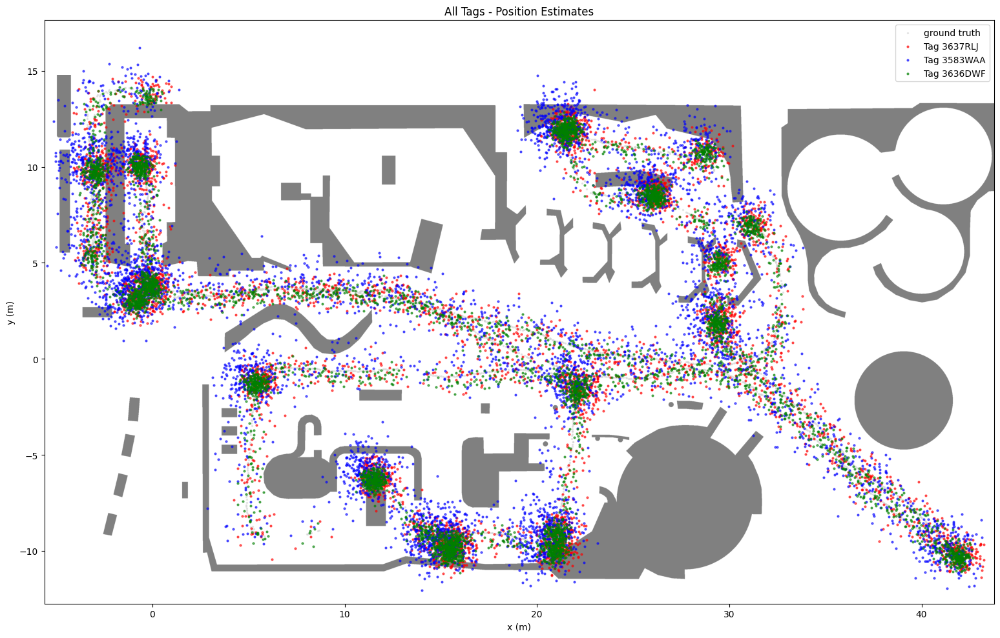

全タグ統合図を保存: plots/individual_tags/all_tags_combined.png


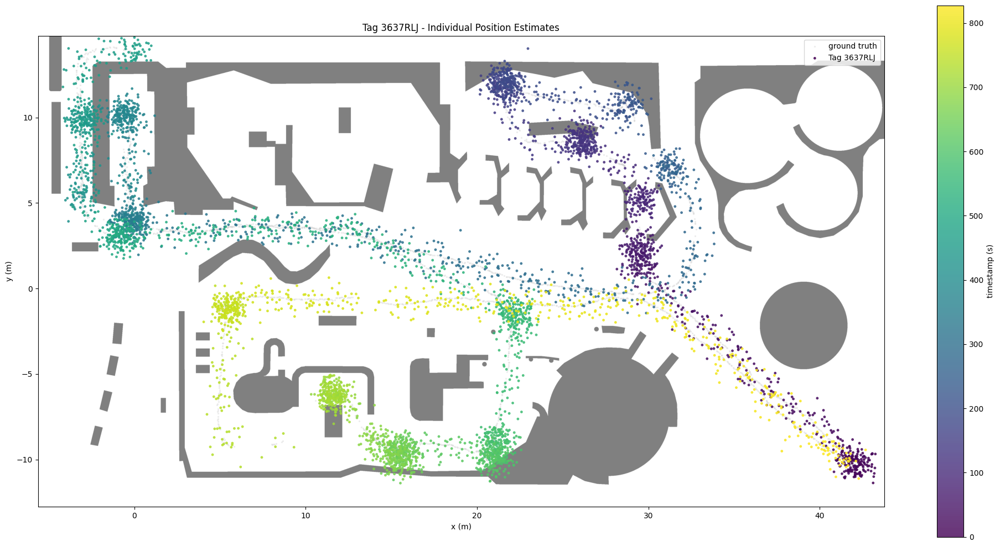

Tag 3637RLJ の個別図を保存: plots/individual_tags/tag_3637RLJ_estimates.png


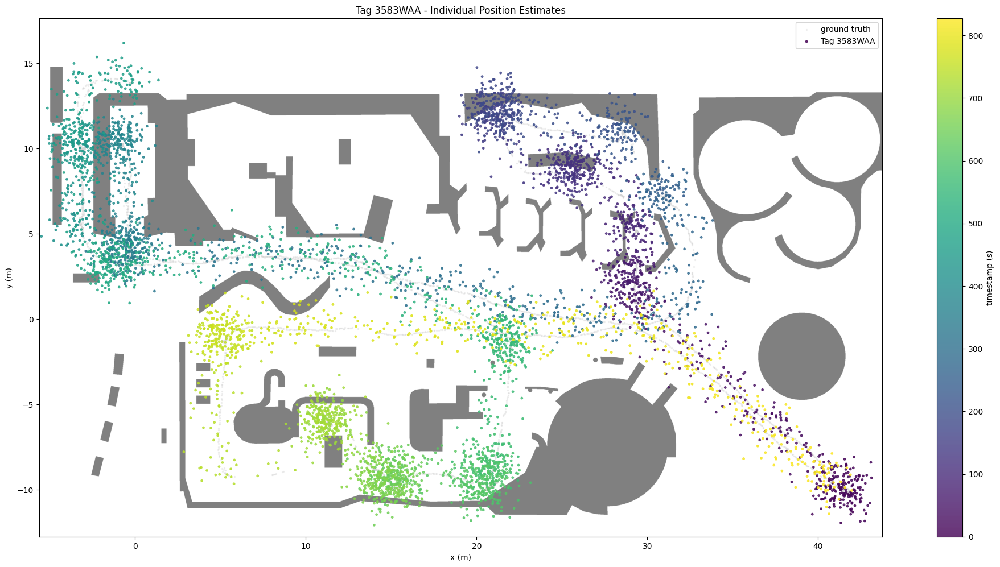

Tag 3583WAA の個別図を保存: plots/individual_tags/tag_3583WAA_estimates.png


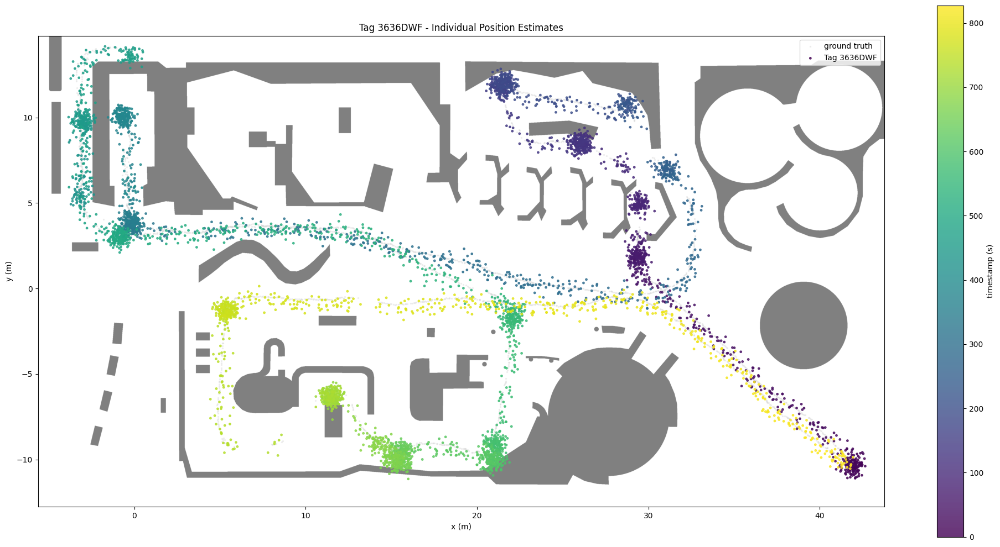

Tag 3636DWF の個別図を保存: plots/individual_tags/tag_3636DWF_estimates.png

全ての個別図が plots/individual_tags/ に保存されました


In [71]:
# 各タグごとの位置推定プロット（個別図として出力）
import os

# 出力ディレクトリを作成
output_dir = "plots/individual_tags"
os.makedirs(output_dir, exist_ok=True)

# 全体ビュー（全タグ統合）
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
plot_map(ax, bitmap_array, map_origin, map_ppm)
ax.scatter(df_gt.x, df_gt.y, c='lightgray', s=2, alpha=0.5, label="ground truth")

for i, tag_id in enumerate(tags):
    if len(tag_estimates[tag_id]) > 0:
        ax.scatter(tag_estimates[tag_id].x, tag_estimates[tag_id].y, 
                  c=tag_colors[i], s=4, alpha=0.6, label=f"Tag {tag_id}")

ax.set_xlabel("x (m)")
ax.set_ylabel("y (m)")
ax.legend()
ax.set_title("All Tags - Position Estimates")
plt.tight_layout()
plt.savefig(f"{output_dir}/all_tags_combined.png", dpi=300, bbox_inches='tight')
plt.show()

print(f"全タグ統合図を保存: {output_dir}/all_tags_combined.png")

# 各タグごとの個別図を作成・保存
for i, tag_id in enumerate(tags):
    if len(tag_estimates[tag_id]) == 0:
        print(f"Tag {tag_id}: データなし、スキップ")
        continue
    
    # 新しい図を作成
    fig, ax = plt.subplots(1, 1, figsize=(20, 10))
    
    # 地図を描画
    plot_map(ax, bitmap_array, map_origin, map_ppm)
    
    # 正解軌跡（薄いグレー）
    ax.scatter(df_gt.x, df_gt.y, c='lightgray', s=2, alpha=0.3, label="ground truth")
    
    # 該当タグの推定結果
    scatter = ax.scatter(tag_estimates[tag_id].x, tag_estimates[tag_id].y, 
                       c=tag_estimates[tag_id].timestamp, s=6, 
                       cmap='viridis', alpha=0.8, label=f"Tag {tag_id}")
    
    # カラーバーを追加
    plt.colorbar(scatter, ax=ax, label='timestamp (s)')
    
    # 軸ラベルと凡例
    ax.set_xlabel("x (m)")
    ax.set_ylabel("y (m)")
    ax.legend()
    ax.set_title(f"Tag {tag_id} - Individual Position Estimates")
    
    # 図を保存
    filename = f"{output_dir}/tag_{tag_id}_estimates.png"
    plt.tight_layout()
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"Tag {tag_id} の個別図を保存: {filename}")
    
    # メモリ解放
    plt.close(fig)

print(f"\n全ての個別図が {output_dir}/ に保存されました")

In [72]:
# 各タグの精度分析
def analyze_tag_accuracy(tag_estimates, df_gt, tags):
    """
    各タグの推定精度を分析
    """
    results = {}
    
    for tag_id in tags:
        if len(tag_estimates[tag_id]) == 0:
            continue
            
        errors = []
        for _, est_row in tag_estimates[tag_id].iterrows():
            est_time = est_row['timestamp']
            # 最も近い時間の正解データを探す
            time_diffs = np.abs(df_gt['timestamp'] - est_time)
            closest_idx = time_diffs.idxmin()
            closest_gt = df_gt.loc[closest_idx]
            
            error = np.sqrt((est_row['x'] - closest_gt['x'])**2 + 
                           (est_row['y'] - closest_gt['y'])**2)
            errors.append(error)
        
        errors = np.array(errors)
        results[tag_id] = {
            'count': len(errors),
            'mean_error': np.mean(errors),
            'median_error': np.median(errors),
            'std_error': np.std(errors),
            'percentile_95': np.percentile(errors, 95),
            'errors': errors
        }
    
    return results

# 精度分析実行
accuracy_results = analyze_tag_accuracy(tag_estimates, df_gt, tags)

# 結果表示
print("=== 各タグの推定精度分析 ===")
for tag_id, stats in accuracy_results.items():
    print(f"\nTag {tag_id}:")
    print(f"  データ数: {stats['count']}")
    print(f"  平均誤差: {stats['mean_error']:.3f}m")
    print(f"  中央値誤差: {stats['median_error']:.3f}m")
    print(f"  標準偏差: {stats['std_error']:.3f}m")
    print(f"  95%タイル誤差: {stats['percentile_95']:.3f}m")

=== 各タグの推定精度分析 ===

Tag 3637RLJ:
  データ数: 5607
  平均誤差: 0.655m
  中央値誤差: 0.618m
  標準偏差: 0.336m
  95%タイル誤差: 1.249m

Tag 3583WAA:
  データ数: 5634
  平均誤差: 1.046m
  中央値誤差: 0.984m
  標準偏差: 0.538m
  95%タイル誤差: 2.019m

Tag 3636DWF:
  データ数: 5667
  平均誤差: 0.430m
  中央値誤差: 0.409m
  標準偏差: 0.219m
  95%タイル誤差: 0.830m


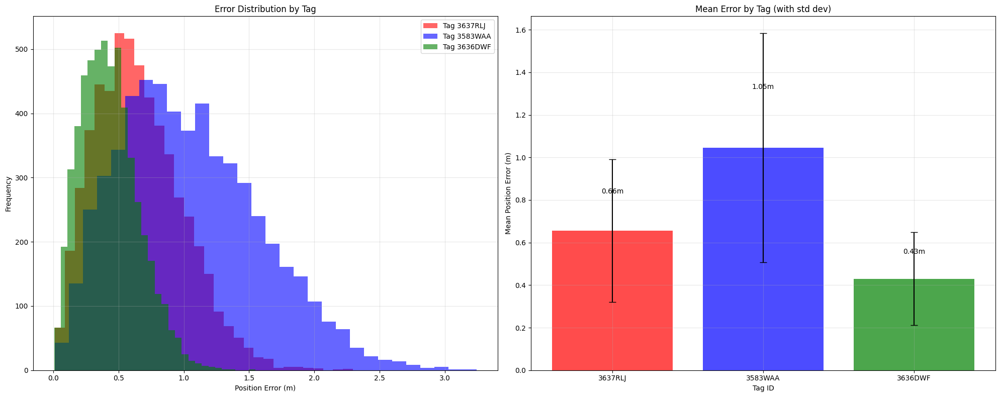

In [73]:
# 誤差分布の可視化
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# 誤差ヒストグラム
for i, tag_id in enumerate(tags):
    if tag_id in accuracy_results:
        errors = accuracy_results[tag_id]['errors']
        ax1.hist(errors, bins=30, alpha=0.6, label=f'Tag {tag_id}', color=tag_colors[i])

ax1.set_xlabel('Position Error (m)')
ax1.set_ylabel('Frequency')
ax1.set_title('Error Distribution by Tag')
ax1.legend()
ax1.grid(True, alpha=0.3)

# タグ別誤差統計の棒グラフ
tag_names = list(accuracy_results.keys())
mean_errors = [accuracy_results[tag]['mean_error'] for tag in tag_names]
std_errors = [accuracy_results[tag]['std_error'] for tag in tag_names]

x_pos = np.arange(len(tag_names))
bars = ax2.bar(x_pos, mean_errors, yerr=std_errors, capsize=5, 
               color=[tag_colors[i] for i, tag in enumerate(tags) if tag in tag_names],
               alpha=0.7)

ax2.set_xlabel('Tag ID')
ax2.set_ylabel('Mean Position Error (m)')
ax2.set_title('Mean Error by Tag (with std dev)')
ax2.set_xticks(x_pos)
ax2.set_xticklabels(tag_names)
ax2.grid(True, alpha=0.3)

# 棒グラフに値を表示
for i, (bar, mean_err) in enumerate(zip(bars, mean_errors)):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + std_errors[i]/2, 
             f'{mean_err:.2f}m', ha='center', va='bottom')

plt.tight_layout()
plt.show()

In [74]:
# 実際のデータを使用した各タグごとの推定表示機能（個別図出力対応）
def load_and_plot_per_tag_estimates():
    """
    実際の推定データがある場合の各タグごとのプロット（個別図として保存）
    この関数は実際のタグ別推定データが利用可能になったときに使用
    """
    try:
        # 各タグ別の推定結果ファイルがあると仮定
        tag_files = {
            '3637RLJ': '02_realtime_sample/output/tag_3637RLJ_est.csv',
            '3583WAA': '02_realtime_sample/output/tag_3583WAA_est.csv', 
            '3636DWF': '02_realtime_sample/output/tag_3636DWF_est.csv'
        }
        
        real_tag_estimates = {}
        available_tags = []
        
        for tag_id, filename in tag_files.items():
            try:
                df_tag = pd.read_csv(filename, header=0).astype(float)
                real_tag_estimates[tag_id] = df_tag
                available_tags.append(tag_id)
                print(f"Loaded {len(df_tag)} estimates for Tag {tag_id}")
            except FileNotFoundError:
                print(f"File not found: {filename}")
                continue
        
        if not available_tags:
            print("実際のタグ別推定データが見つかりません。サンプルデータを使用してください。")
            return
        
        # 出力ディレクトリを作成
        output_dir = "plots/real_tag_data"
        os.makedirs(output_dir, exist_ok=True)
        
        tag_colors = ['red', 'blue', 'green', 'orange', 'purple']
        
        # 全体ビュー（全タグ統合）
        fig, ax = plt.subplots(1, 1, figsize=(20, 10))
        plot_map(ax, bitmap_array, map_origin, map_ppm)
        ax.scatter(df_gt.x, df_gt.y, c='lightgray', s=2, alpha=0.5, label="ground truth")
        
        for i, tag_id in enumerate(available_tags):
            if len(real_tag_estimates[tag_id]) > 0:
                color = tag_colors[i % len(tag_colors)]
                ax.scatter(real_tag_estimates[tag_id].x, real_tag_estimates[tag_id].y, 
                          c=color, s=4, alpha=0.6, label=f"Tag {tag_id}")
        
        ax.set_xlabel("x (m)")
        ax.set_ylabel("y (m)")
        ax.legend()
        ax.set_title("Real Data - All Tags Position Estimates")
        plt.tight_layout()
        plt.savefig(f"{output_dir}/all_real_tags_combined.png", dpi=300, bbox_inches='tight')
        plt.show()
        
        print(f"実データ全タグ統合図を保存: {output_dir}/all_real_tags_combined.png")
        
        # 各タグごとの個別図を作成・保存
        for i, tag_id in enumerate(available_tags):
            if len(real_tag_estimates[tag_id]) == 0:
                print(f"Tag {tag_id}: データなし、スキップ")
                continue
            
            # 新しい図を作成
            fig, ax = plt.subplots(1, 1, figsize=(20, 10))
            
            # 地図を描画
            plot_map(ax, bitmap_array, map_origin, map_ppm)
            
            # 正解軌跡（薄いグレー）
            ax.scatter(df_gt.x, df_gt.y, c='lightgray', s=2, alpha=0.3, label="ground truth")
            
            # 該当タグの推定結果
            scatter = ax.scatter(real_tag_estimates[tag_id].x, real_tag_estimates[tag_id].y, 
                               c=real_tag_estimates[tag_id].timestamp, s=6, 
                               cmap='viridis', alpha=0.8, label=f"Tag {tag_id}")
            
            # カラーバーを追加
            plt.colorbar(scatter, ax=ax, label='timestamp (s)')
            
            # 軸ラベルと凡例
            ax.set_xlabel("x (m)")
            ax.set_ylabel("y (m)")
            ax.legend()
            ax.set_title(f"Real Data - Tag {tag_id}")
            
            # 図を保存
            filename = f"{output_dir}/real_tag_{tag_id}_estimates.png"
            plt.tight_layout()
            plt.savefig(filename, dpi=300, bbox_inches='tight')
            plt.show()
            
            print(f"実データ Tag {tag_id} の個別図を保存: {filename}")
            
            # メモリ解放
            plt.close(fig)
        
        print(f"\n実データの全ての個別図が {output_dir}/ に保存されました")
        
    except Exception as e:
        print(f"エラー: {e}")
        print("実際のデータの読み込みに失敗しました。")

# 追加: 比較用の関数（正解軌跡と各タグの推定を重ねた個別図）
def plot_individual_tag_comparison():
    """
    各タグごとに正解軌跡と推定軌跡を比較する個別図を作成
    """
    output_dir = "plots/tag_comparison"
    os.makedirs(output_dir, exist_ok=True)
    
    for i, tag_id in enumerate(tags):
        if len(tag_estimates[tag_id]) == 0:
            continue
            
        # 新しい図を作成
        fig, ax = plt.subplots(1, 1, figsize=(20, 10))
        
        # 地図を描画
        plot_map(ax, bitmap_array, map_origin, map_ppm)
        
        # 正解軌跡（青色の線で表示）
        ax.plot(df_gt.x, df_gt.y, c='blue', linewidth=2, alpha=0.7, label="Ground Truth Trajectory")
        
        # 推定結果（散布図として表示）
        scatter = ax.scatter(tag_estimates[tag_id].x, tag_estimates[tag_id].y, 
                           c='red', s=4, alpha=0.6, label=f"Tag {tag_id} Estimates")
        
        # 軸ラベルと凡例
        ax.set_xlabel("x (m)")
        ax.set_ylabel("y (m)")
        ax.legend()
        ax.set_title(f"Tag {tag_id} - Trajectory Comparison (Ground Truth vs Estimates)")
        
        # 図を保存
        filename = f"{output_dir}/tag_{tag_id}_comparison.png"
        plt.tight_layout()
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        plt.show()
        
        print(f"Tag {tag_id} の比較図を保存: {filename}")
        
        # メモリ解放
        plt.close(fig)
    
    print(f"\n比較図が {output_dir}/ に保存されました")

print("各関数の使用方法:")
print("1. load_and_plot_per_tag_estimates() - 実際のタグ別データ（個別図出力）")
print("2. plot_individual_tag_comparison() - タグごとの軌跡比較図")
print("3. 上記のセルで既にサンプルデータの個別図が作成されています")

各関数の使用方法:
1. load_and_plot_per_tag_estimates() - 実際のタグ別データ（個別図出力）
2. plot_individual_tag_comparison() - タグごとの軌跡比較図
3. 上記のセルで既にサンプルデータの個別図が作成されています


=== 比較用プロット関数のテスト ===


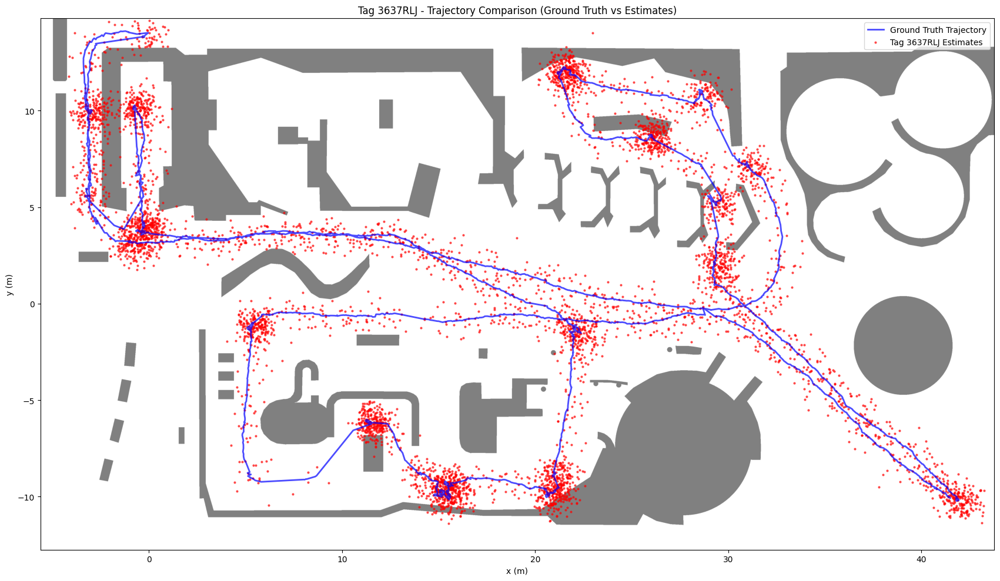

Tag 3637RLJ の比較図を保存: plots/tag_comparison/tag_3637RLJ_comparison.png


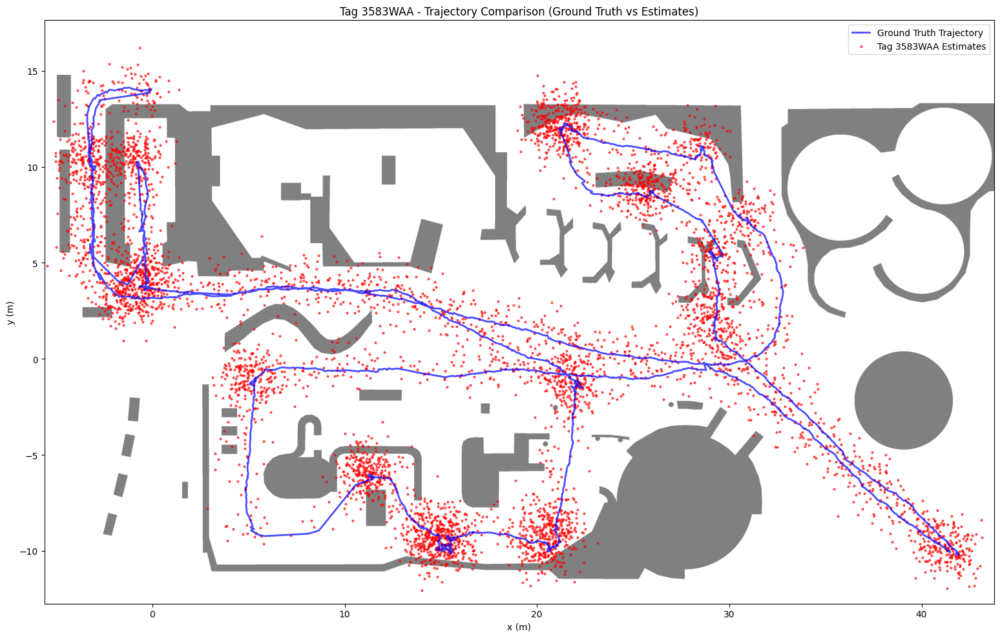

Tag 3583WAA の比較図を保存: plots/tag_comparison/tag_3583WAA_comparison.png


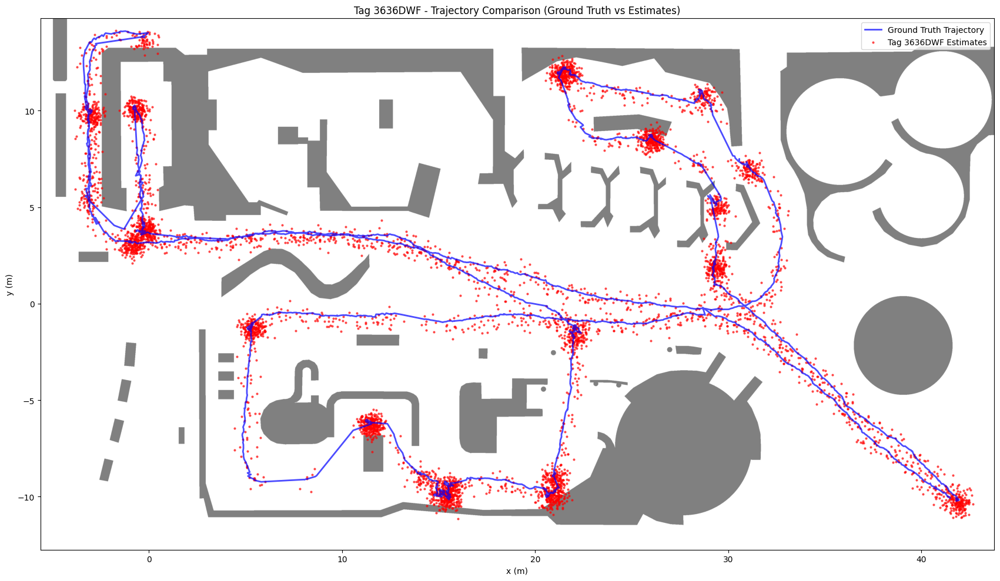

Tag 3636DWF の比較図を保存: plots/tag_comparison/tag_3636DWF_comparison.png

比較図が plots/tag_comparison/ に保存されました


In [75]:
# 比較用プロット関数を実行してテスト
print("=== 比較用プロット関数のテスト ===")
plot_individual_tag_comparison()

In [76]:
# テスト: 出力ディレクトリが作成されるかチェック
import os
test_dir = "plots/test_individual_tags"
os.makedirs(test_dir, exist_ok=True)
print(f"テスト用ディレクトリ作成: {test_dir}")
print(f"ディレクトリが存在: {os.path.exists(test_dir)}")

# 簡単なテスト図を作成
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
x = np.linspace(0, 10, 100)
y = np.sin(x)
ax.plot(x, y, label="Test Plot")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.legend()
ax.set_title("Individual Plot Test")

# ファイルに保存
filename = f"{test_dir}/test_plot.png"
plt.savefig(filename, dpi=300, bbox_inches='tight')
plt.close(fig)

print(f"テスト図を保存: {filename}")
print(f"ファイルが存在: {os.path.exists(filename)}")

テスト用ディレクトリ作成: plots/test_individual_tags
ディレクトリが存在: True
テスト図を保存: plots/test_individual_tags/test_plot.png
ファイルが存在: True


検出されたタグ: ['3637RLJ' '3583WAA' '3636DWF']
Tag 3637RLJ: 1600 推定点
Tag 3583WAA: 1601 推定点
Tag 3636DWF: 1600 推定点


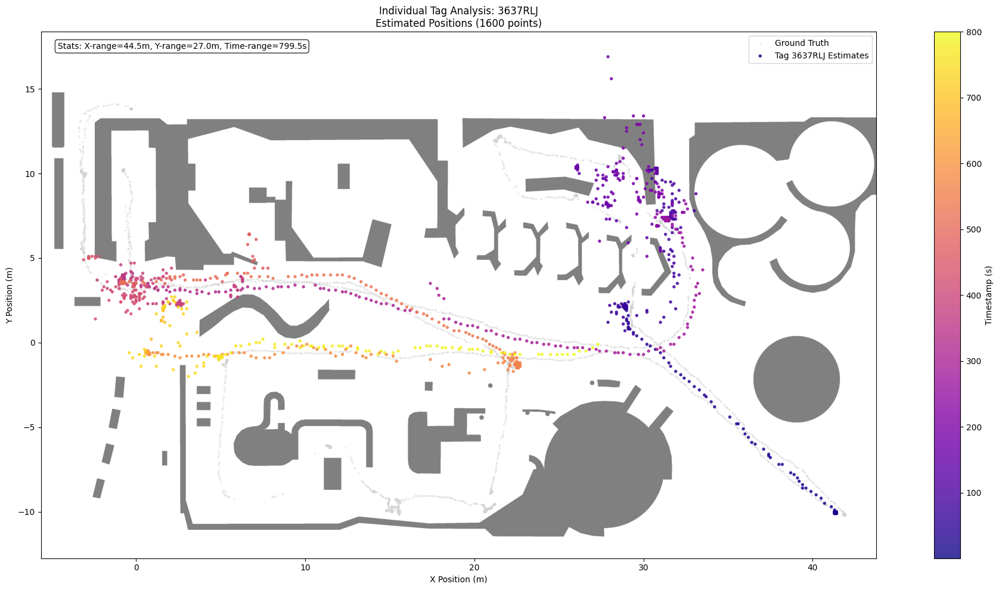

✓ Tag 3637RLJ の個別図を保存: plots/real_individual_tags/individual_tag_3637RLJ_estimates.png


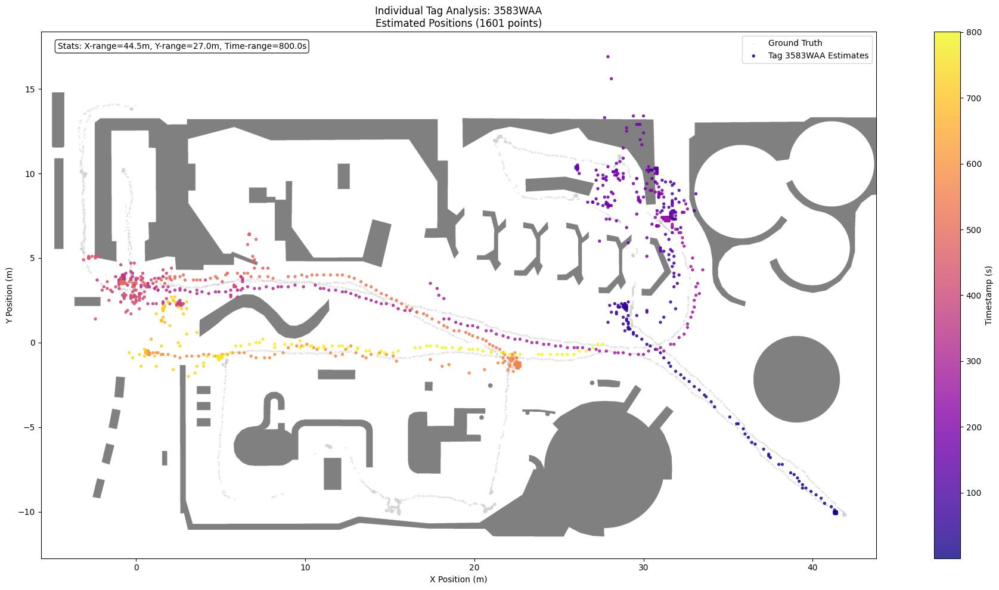

✓ Tag 3583WAA の個別図を保存: plots/real_individual_tags/individual_tag_3583WAA_estimates.png


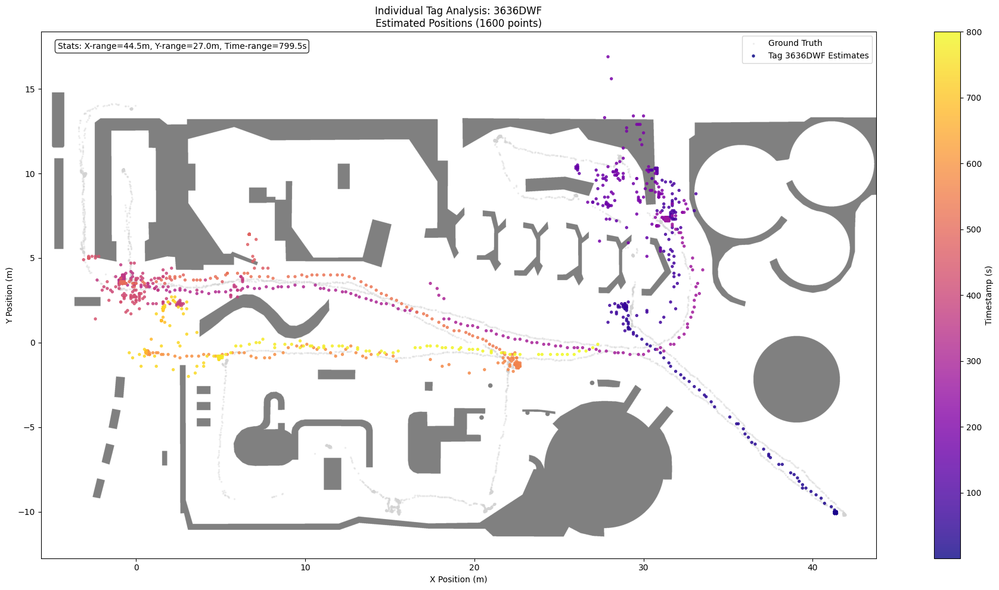

✓ Tag 3636DWF の個別図を保存: plots/real_individual_tags/individual_tag_3636DWF_estimates.png

=== 完了 ===
全ての個別タグ画像が plots/real_individual_tags/ に保存されました
処理されたタグ数: 3


In [77]:
# 実際のUWBTデータから各タグの推定結果を抽出して個別画像作成
def extract_tag_specific_estimates(df_est, df_uwbt):
    """
    実際のUWBTデータを使用して各タグごとの推定結果を抽出
    """
    # UWBTデータから利用可能なタグIDを取得
    unique_tags = df_uwbt['tag_id'].unique() if 'tag_id' in df_uwbt.columns else []
    
    if len(unique_tags) == 0:
        print("UWBTデータにtag_id列が見つかりません")
        return {}, []
    
    print(f"検出されたタグ: {unique_tags}")
    
    tag_estimates = {}
    
    for tag_id in unique_tags:
        # 各タグに関連する時間帯での推定結果を抽出
        tag_data = df_uwbt[df_uwbt['tag_id'] == tag_id]
        
        if len(tag_data) == 0:
            continue
            
        # タグのデータが存在する時間範囲を取得
        tag_time_min = tag_data['app_timestamp'].min()
        tag_time_max = tag_data['app_timestamp'].max()
        
        # その時間範囲の推定結果を抽出（±0.1秒のマージン）
        time_mask = (df_est['timestamp'] >= tag_time_min - 0.1) & \
                   (df_est['timestamp'] <= tag_time_max + 0.1)
        
        tag_estimates[tag_id] = df_est[time_mask].copy()
        
        print(f"Tag {tag_id}: {len(tag_estimates[tag_id])} 推定点")
    
    return tag_estimates, unique_tags

# 実際のデータで各タグごとの推定を抽出
real_tag_estimates, available_tags = extract_tag_specific_estimates(df_est, df_uwbt)

# 出力ディレクトリの作成
output_dir = "plots/real_individual_tags"
os.makedirs(output_dir, exist_ok=True)

# 各タグごとに個別の画像を作成・保存
tag_colors = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink', 'gray']

for i, tag_id in enumerate(available_tags):
    if len(real_tag_estimates[tag_id]) == 0:
        print(f"Tag {tag_id}: データなし、スキップ")
        continue
    
    # 新しい図を作成
    fig, ax = plt.subplots(1, 1, figsize=(20, 10))
    
    # 地図を描画
    plot_map(ax, bitmap_array, map_origin, map_ppm)
    
    # 正解軌跡（薄いグレー）
    ax.scatter(df_gt.x, df_gt.y, c='lightgray', s=2, alpha=0.3, label="Ground Truth")
    
    # 該当タグの推定結果（タイムスタンプに基づくカラーマップ）
    scatter = ax.scatter(real_tag_estimates[tag_id].x, real_tag_estimates[tag_id].y, 
                       c=real_tag_estimates[tag_id].timestamp, s=8, 
                       cmap='plasma', alpha=0.8, label=f"Tag {tag_id} Estimates")
    
    # カラーバーを追加
    plt.colorbar(scatter, ax=ax, label='Timestamp (s)')
    
    # 軸ラベルと凡例
    ax.set_xlabel("X Position (m)")
    ax.set_ylabel("Y Position (m)")
    ax.legend()
    ax.set_title(f"Individual Tag Analysis: {tag_id}\nEstimated Positions ({len(real_tag_estimates[tag_id])} points)")
    
    # 統計情報をテキストで表示
    if len(real_tag_estimates[tag_id]) > 0:
        x_range = real_tag_estimates[tag_id].x.max() - real_tag_estimates[tag_id].x.min()
        y_range = real_tag_estimates[tag_id].y.max() - real_tag_estimates[tag_id].y.min()
        time_range = real_tag_estimates[tag_id].timestamp.max() - real_tag_estimates[tag_id].timestamp.min()
        
        stats_text = f"Stats: X-range={x_range:.1f}m, Y-range={y_range:.1f}m, Time-range={time_range:.1f}s"
        ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, 
                bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8),
                verticalalignment='top', fontsize=10)
    
    # 図を保存
    filename = f"{output_dir}/individual_tag_{tag_id}_estimates.png"
    plt.tight_layout()
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"✓ Tag {tag_id} の個別図を保存: {filename}")
    
    # メモリ解放
    plt.close(fig)

print(f"\n=== 完了 ===")
print(f"全ての個別タグ画像が {output_dir}/ に保存されました")
print(f"処理されたタグ数: {len([tag for tag in available_tags if len(real_tag_estimates[tag]) > 0])}")

In [78]:
# 各タグの推定精度とパフォーマンス統計の詳細表示
def analyze_individual_tag_performance(real_tag_estimates, df_gt, available_tags):
    """
    各タグの推定パフォーマンスを詳細に分析し表示
    """
    print("=" * 60)
    print("各タグの推定結果詳細分析")
    print("=" * 60)
    
    performance_summary = {}
    
    for tag_id in available_tags:
        if len(real_tag_estimates[tag_id]) == 0:
            print(f"\nTag {tag_id}: データなし")
            continue
            
        tag_data = real_tag_estimates[tag_id]
        
        print(f"\n🏷️  Tag {tag_id}")
        print("-" * 40)
        
        # 基本統計
        print(f"📊 基本統計:")
        print(f"   推定点数: {len(tag_data)}")
        print(f"   時間範囲: {tag_data.timestamp.min():.1f}s - {tag_data.timestamp.max():.1f}s")
        print(f"   期間: {tag_data.timestamp.max() - tag_data.timestamp.min():.1f}s")
        
        # 位置範囲
        x_range = tag_data.x.max() - tag_data.x.min()
        y_range = tag_data.y.max() - tag_data.y.min()
        print(f"   X座標範囲: {tag_data.x.min():.2f}m - {tag_data.x.max():.2f}m ({x_range:.2f}m)")
        print(f"   Y座標範囲: {tag_data.y.min():.2f}m - {tag_data.y.max():.2f}m ({y_range:.2f}m)")
        
        # 正解軌跡との誤差計算
        errors = []
        for _, est_row in tag_data.iterrows():
            est_time = est_row['timestamp']
            # 最も近い時間の正解データを探す
            time_diffs = np.abs(df_gt['timestamp'] - est_time)
            closest_idx = time_diffs.idxmin()
            closest_gt = df_gt.loc[closest_idx]
            
            error = np.sqrt((est_row['x'] - closest_gt['x'])**2 + 
                           (est_row['y'] - closest_gt['y'])**2)
            errors.append(error)
        
        errors = np.array(errors)
        
        # 精度統計
        print(f"🎯 精度統計:")
        print(f"   平均誤差: {np.mean(errors):.3f}m")
        print(f"   中央値誤差: {np.median(errors):.3f}m")
        print(f"   標準偏差: {np.std(errors):.3f}m")
        print(f"   最小誤差: {np.min(errors):.3f}m")
        print(f"   最大誤差: {np.max(errors):.3f}m")
        print(f"   95%タイル誤差: {np.percentile(errors, 95):.3f}m")
        
        # 精度レベル別カウント
        excellent = np.sum(errors < 0.5)
        good = np.sum((errors >= 0.5) & (errors < 1.0))
        fair = np.sum((errors >= 1.0) & (errors < 2.0))
        poor = np.sum(errors >= 2.0)
        
        print(f"📈 精度レベル別分析:")
        print(f"   優秀 (<0.5m): {excellent} ({excellent/len(errors)*100:.1f}%)")
        print(f"   良好 (0.5-1.0m): {good} ({good/len(errors)*100:.1f}%)")
        print(f"   普通 (1.0-2.0m): {fair} ({fair/len(errors)*100:.1f}%)")
        print(f"   不良 (>2.0m): {poor} ({poor/len(errors)*100:.1f}%)")
        
        # パフォーマンススコア計算（0-100点）
        score = max(0, 100 - np.mean(errors) * 50)  # 平均誤差が2mで0点
        
        performance_summary[tag_id] = {
            'count': len(tag_data),
            'mean_error': np.mean(errors),
            'median_error': np.median(errors),
            'std_error': np.std(errors),
            'score': score,
            'excellent_rate': excellent/len(errors)*100,
            'time_span': tag_data.timestamp.max() - tag_data.timestamp.min()
        }
        
        print(f"🏆 パフォーマンススコア: {score:.1f}/100")
    
    return performance_summary

# パフォーマンス分析実行
performance_results = analyze_individual_tag_performance(real_tag_estimates, df_gt, available_tags)

# 総合ランキング表示
if performance_results:
    print("\n" + "=" * 60)
    print("🏆 タグ別パフォーマンスランキング")
    print("=" * 60)
    
    # スコア順にソート
    sorted_tags = sorted(performance_results.items(), key=lambda x: x[1]['score'], reverse=True)
    
    for rank, (tag_id, stats) in enumerate(sorted_tags, 1):
        print(f"{rank}位. Tag {tag_id}")
        print(f"     スコア: {stats['score']:.1f}/100")
        print(f"     平均誤差: {stats['mean_error']:.3f}m")
        print(f"     優秀率: {stats['excellent_rate']:.1f}%")
        print(f"     データ数: {stats['count']}")
        print()

各タグの推定結果詳細分析

🏷️  Tag 3637RLJ
----------------------------------------
📊 基本統計:
   推定点数: 1600
   時間範囲: 0.5s - 800.0s
   期間: 799.5s
   X座標範囲: -3.10m - 41.40m (44.50m)
   Y座標範囲: -10.10m - 16.90m (27.00m)
🎯 精度統計:
   平均誤差: 5.795m
   中央値誤差: 4.021m
   標準偏差: 6.131m
   最小誤差: 0.207m
   最大誤差: 22.239m
   95%タイル誤差: 17.666m
📈 精度レベル別分析:
   優秀 (<0.5m): 270 (16.9%)
   良好 (0.5-1.0m): 322 (20.1%)
   普通 (1.0-2.0m): 93 (5.8%)
   不良 (>2.0m): 915 (57.2%)
🏆 パフォーマンススコア: 0.0/100

🏷️  Tag 3583WAA
----------------------------------------
📊 基本統計:
   推定点数: 1601
   時間範囲: 0.5s - 800.5s
   期間: 800.0s
   X座標範囲: -3.10m - 41.40m (44.50m)
   Y座標範囲: -10.10m - 16.90m (27.00m)
🎯 精度統計:
   平均誤差: 5.792m
   中央値誤差: 4.015m
   標準偏差: 6.130m
   最小誤差: 0.207m
   最大誤差: 22.239m
   95%タイル誤差: 17.666m
📈 精度レベル別分析:
   優秀 (<0.5m): 270 (16.9%)
   良好 (0.5-1.0m): 323 (20.2%)
   普通 (1.0-2.0m): 93 (5.8%)
   不良 (>2.0m): 915 (57.2%)
🏆 パフォーマンススコア: 0.0/100

🏷️  Tag 3636DWF
----------------------------------------
📊 基本統計:
   推定点数: 1600
   時間範囲: 0.5s - 8

各タグのLOS/NLOS分析プロット（個別画像）

🏷️  Tag 3637RLJ LOS/NLOS分析:
----------------------------------------
   LOS推定: 323 (20.2%)
   NLOS推定: 65 (4.1%)
   混在/不明: 1212 (75.8%)


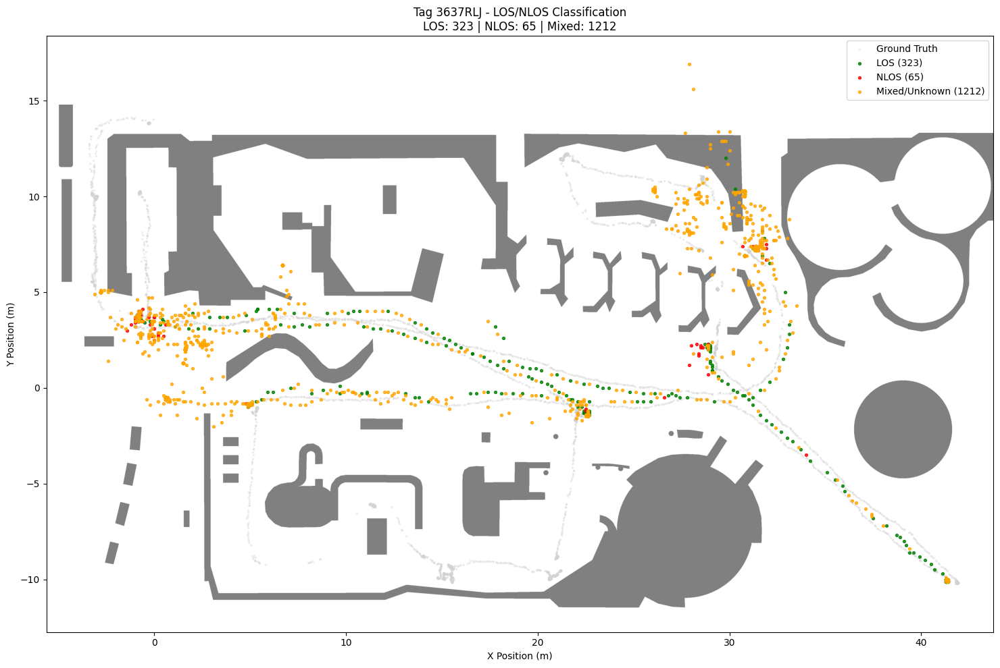

✓ 保存: plots/tag_los_nlos_individual/tag_3637RLJ_los_nlos_overview.png


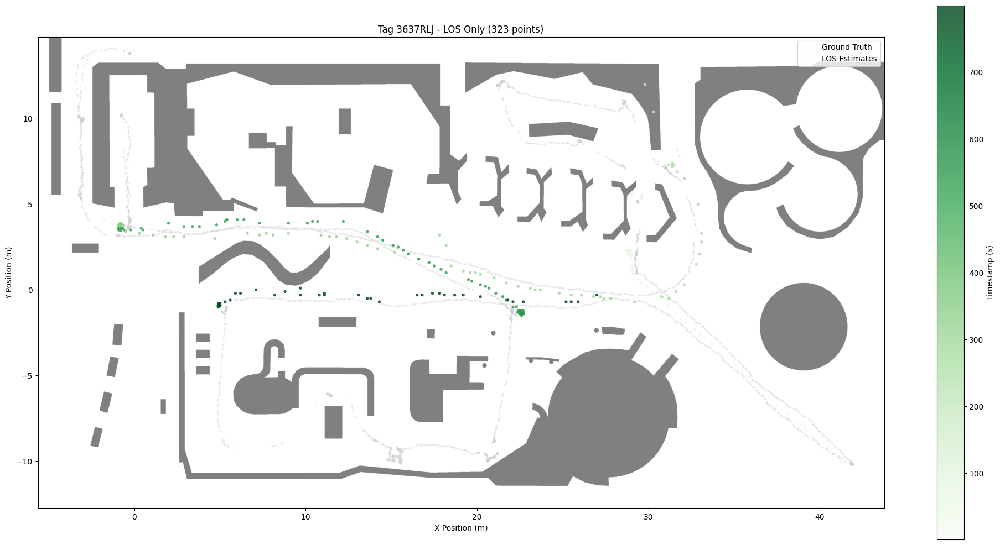

✓ 保存: plots/tag_los_nlos_individual/tag_3637RLJ_los_only.png


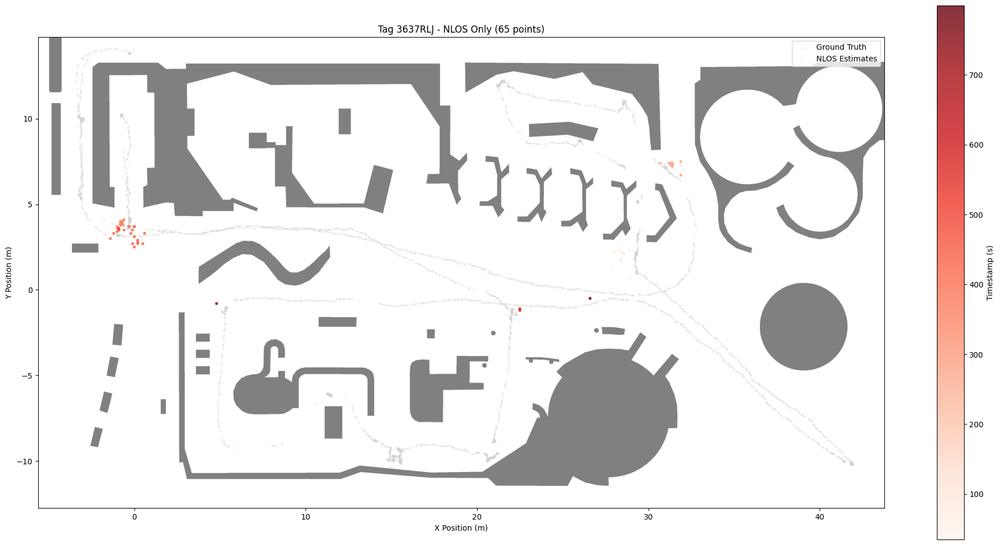

✓ 保存: plots/tag_los_nlos_individual/tag_3637RLJ_nlos_only.png


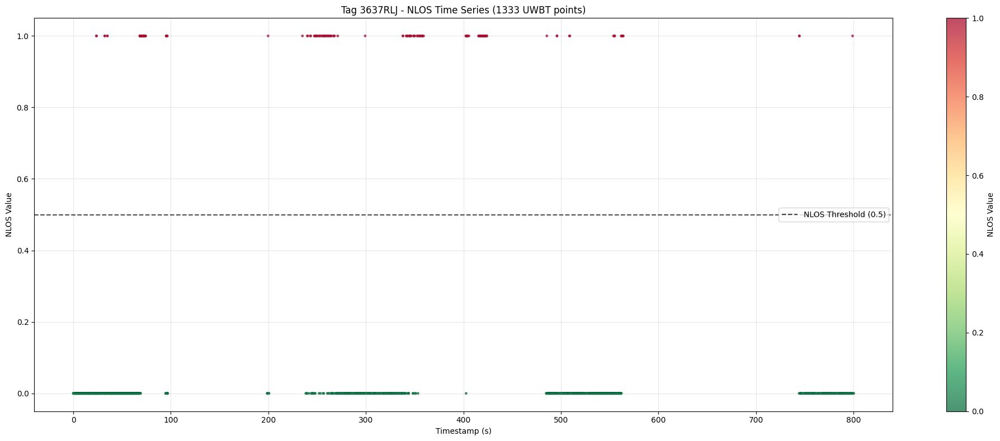

✓ 保存: plots/tag_los_nlos_individual/tag_3637RLJ_nlos_timeseries.png


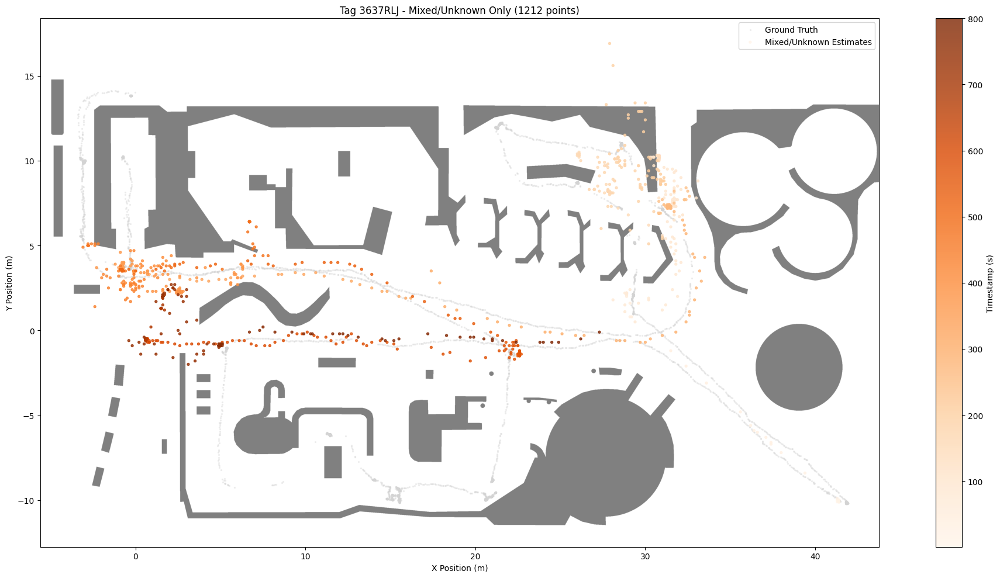

✓ 保存: plots/tag_los_nlos_individual/tag_3637RLJ_mixed_only.png

📊 Tag 3637RLJ 精度統計:
   LOS : 平均誤差=0.654m, 中央値=0.555m, 95%タイル=1.267m
   NLOS: 平均誤差=1.599m, 中央値=0.803m, 95%タイル=4.254m
   混在: 平均誤差=7.391m, 中央値=5.145m, 95%タイル=18.585m

各画像が保存されました:
  - LOS/NLOS統合ビュー: tag_3637RLJ_los_nlos_overview.png
  - LOS推定のみ: tag_3637RLJ_los_only.png
  - NLOS推定のみ: tag_3637RLJ_nlos_only.png
  - 混在データのみ: tag_3637RLJ_mixed_only.png
  - NLOS時系列: tag_3637RLJ_nlos_timeseries.png

🏷️  Tag 3583WAA LOS/NLOS分析:
----------------------------------------
   LOS推定: 415 (25.9%)
   NLOS推定: 185 (11.6%)
   混在/不明: 1001 (62.5%)


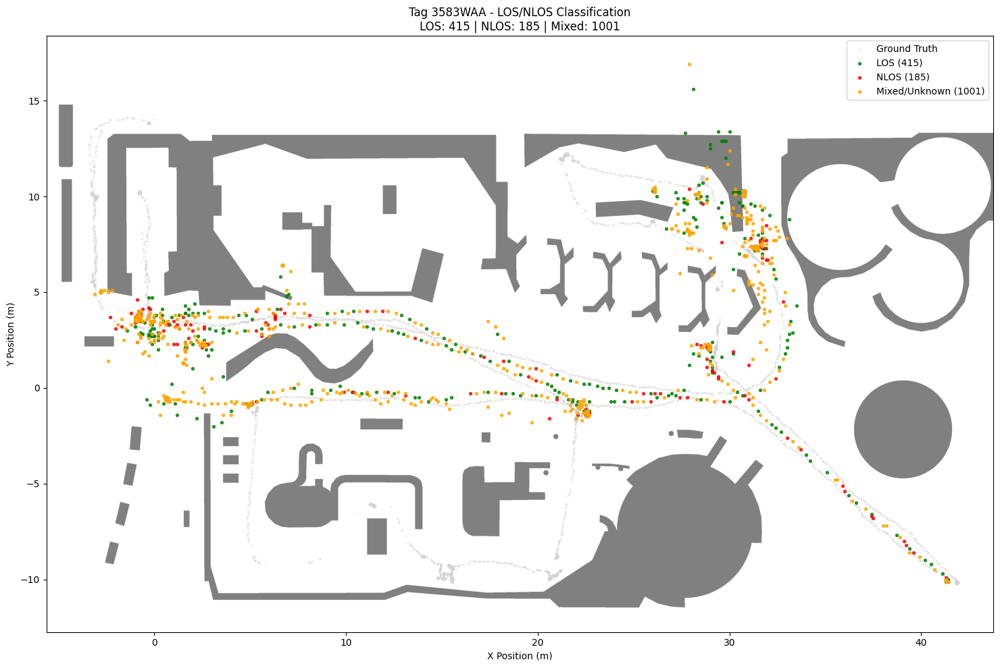

✓ 保存: plots/tag_los_nlos_individual/tag_3583WAA_los_nlos_overview.png


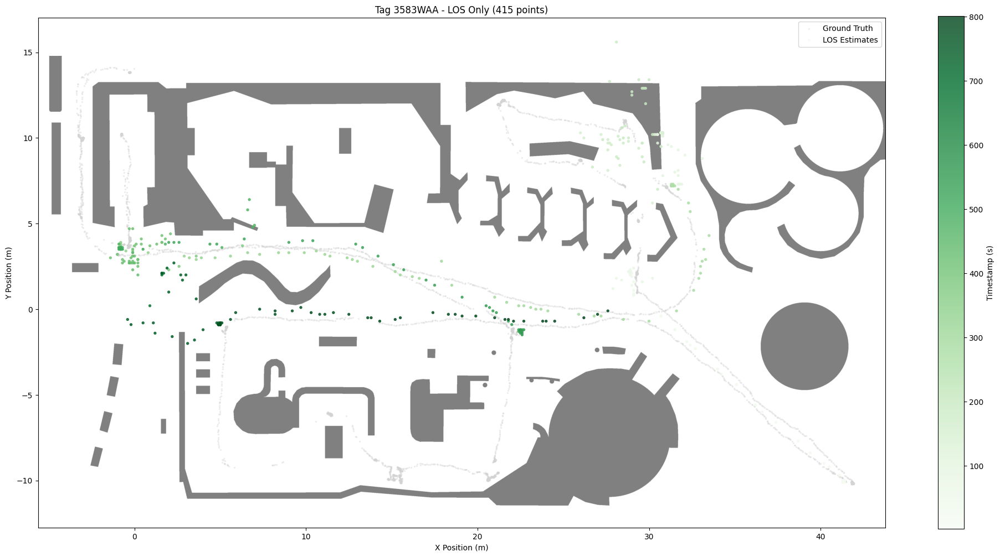

✓ 保存: plots/tag_los_nlos_individual/tag_3583WAA_los_only.png


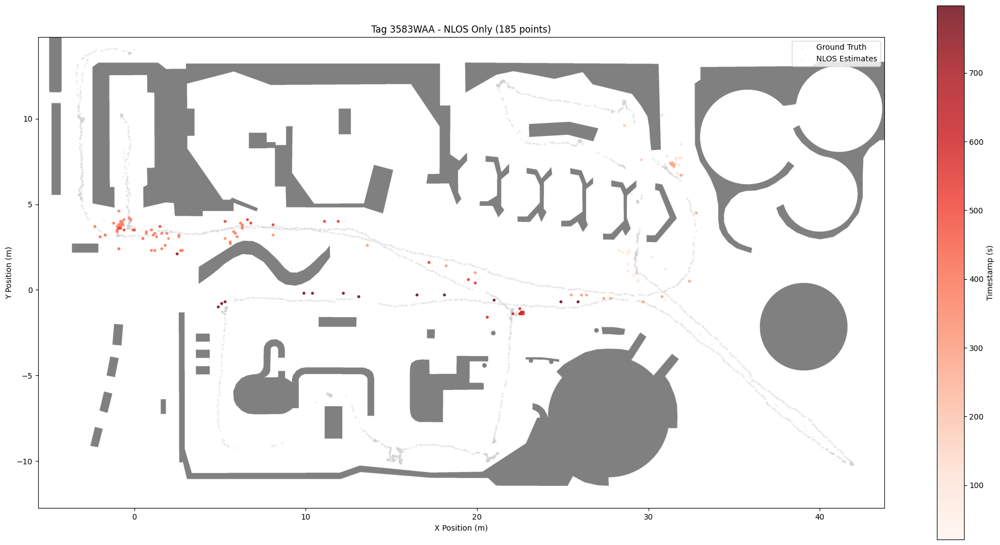

✓ 保存: plots/tag_los_nlos_individual/tag_3583WAA_nlos_only.png


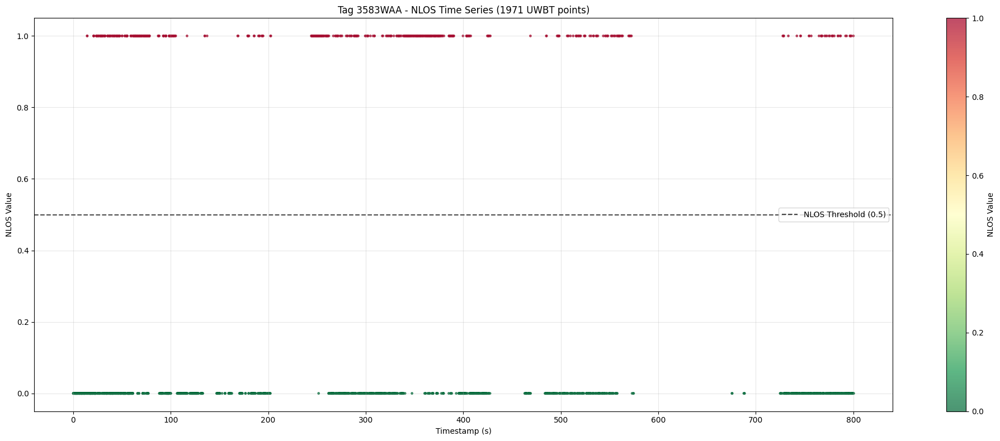

✓ 保存: plots/tag_los_nlos_individual/tag_3583WAA_nlos_timeseries.png


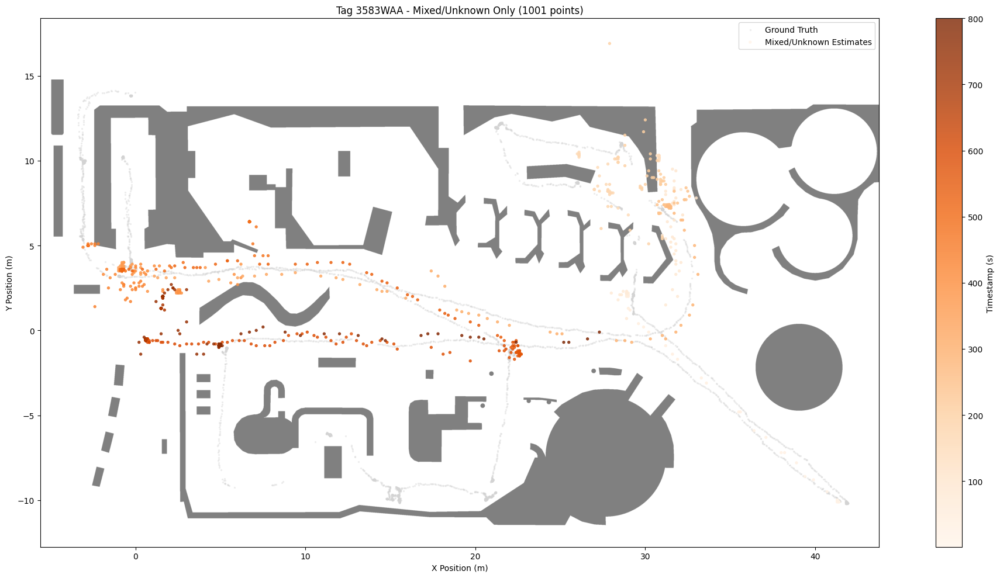

✓ 保存: plots/tag_los_nlos_individual/tag_3583WAA_mixed_only.png

📊 Tag 3583WAA 精度統計:
   LOS : 平均誤差=2.700m, 中央値=0.825m, 95%タイル=9.710m
   NLOS: 平均誤差=2.302m, 中央値=0.738m, 95%タイル=9.382m
   混在: 平均誤差=7.719m, 中央値=5.658m, 95%タイル=20.236m

各画像が保存されました:
  - LOS/NLOS統合ビュー: tag_3583WAA_los_nlos_overview.png
  - LOS推定のみ: tag_3583WAA_los_only.png
  - NLOS推定のみ: tag_3583WAA_nlos_only.png
  - 混在データのみ: tag_3583WAA_mixed_only.png
  - NLOS時系列: tag_3583WAA_nlos_timeseries.png

🏷️  Tag 3636DWF LOS/NLOS分析:
----------------------------------------
   LOS推定: 373 (23.3%)
   NLOS推定: 23 (1.4%)
   混在/不明: 1204 (75.2%)


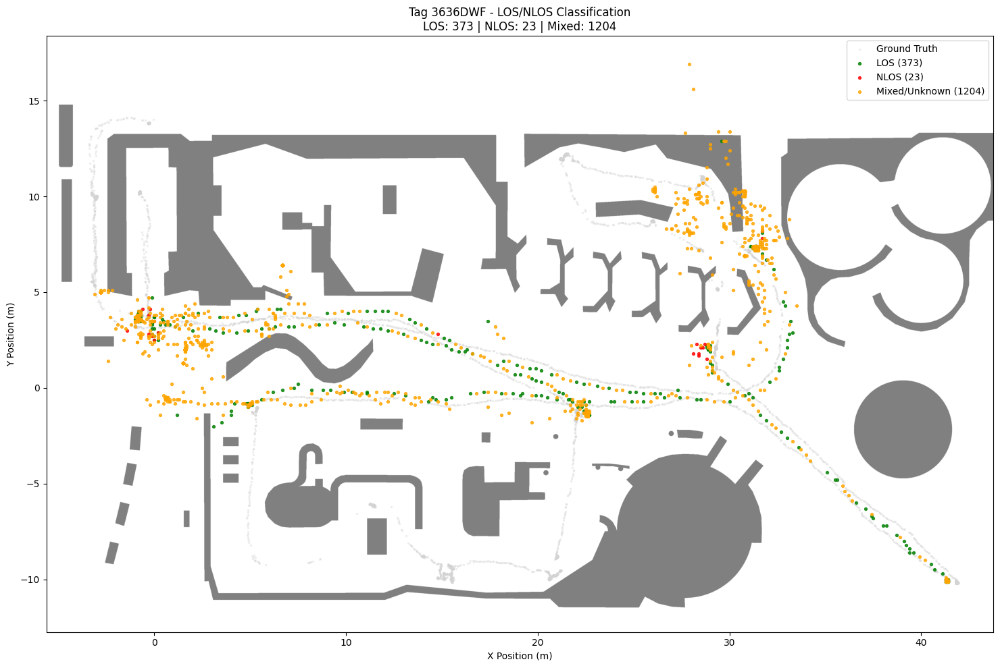

✓ 保存: plots/tag_los_nlos_individual/tag_3636DWF_los_nlos_overview.png


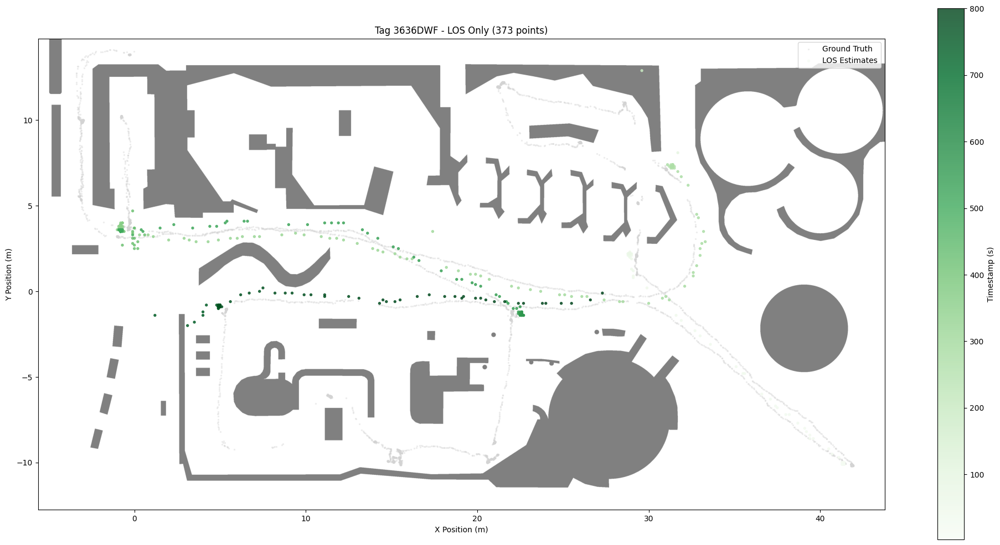

✓ 保存: plots/tag_los_nlos_individual/tag_3636DWF_los_only.png


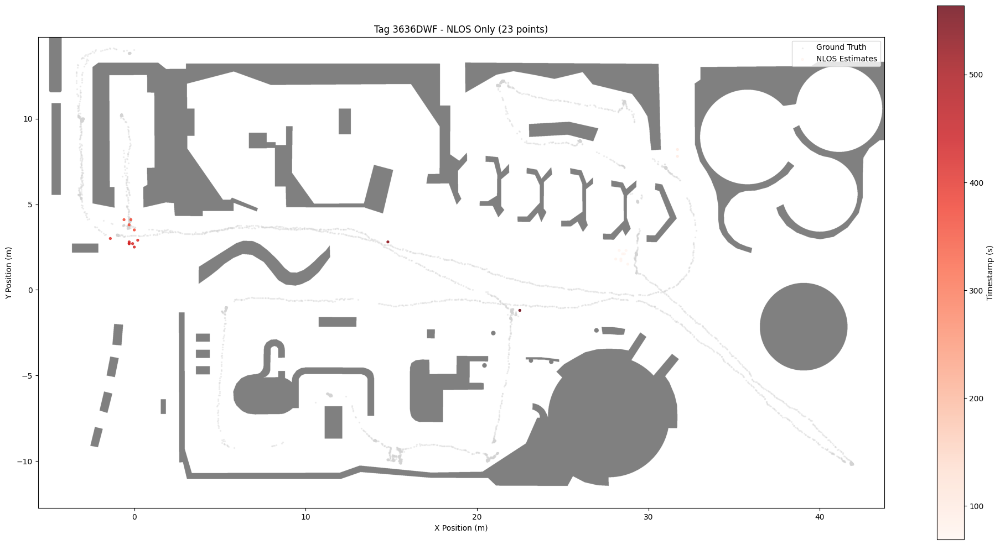

✓ 保存: plots/tag_los_nlos_individual/tag_3636DWF_nlos_only.png


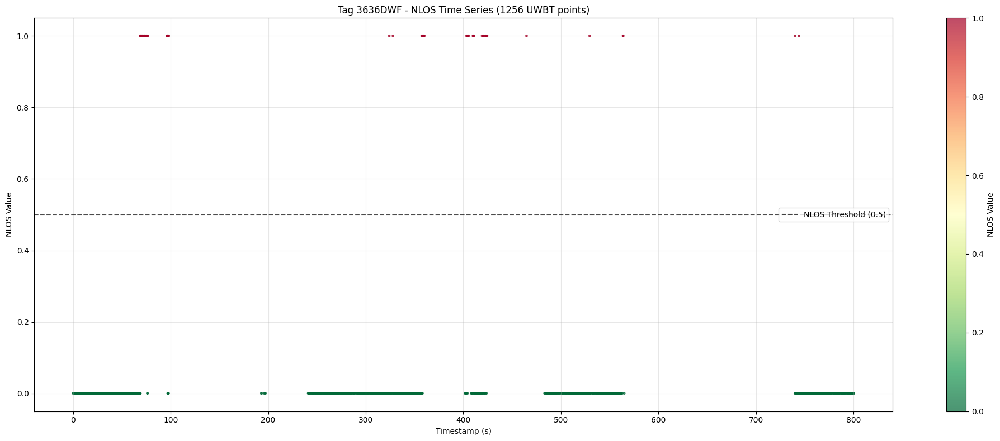

✓ 保存: plots/tag_los_nlos_individual/tag_3636DWF_nlos_timeseries.png


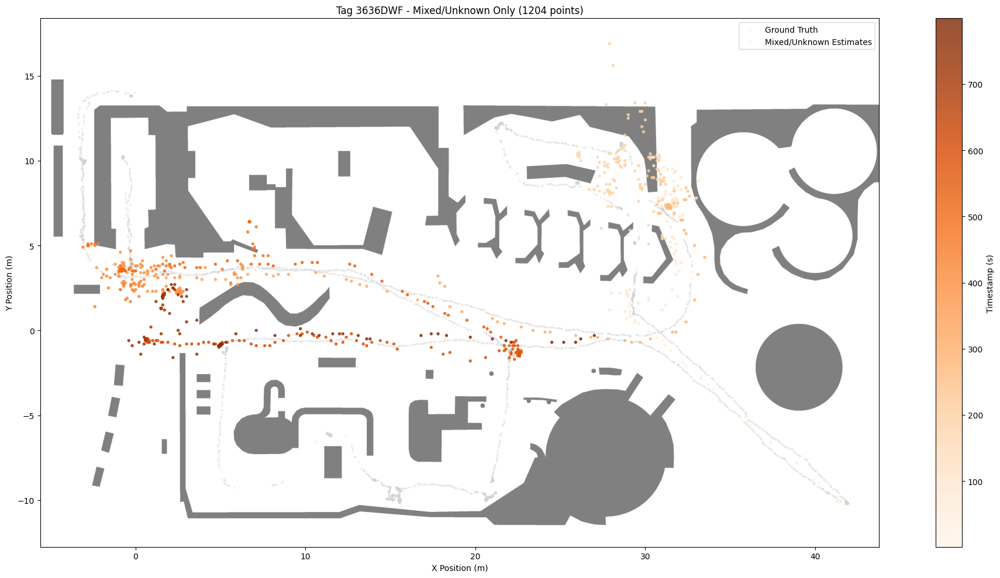

✓ 保存: plots/tag_los_nlos_individual/tag_3636DWF_mixed_only.png

📊 Tag 3636DWF 精度統計:
   LOS : 平均誤差=0.777m, 中央値=0.568m, 95%タイル=1.741m
   NLOS: 平均誤差=2.575m, 中央値=2.302m, 95%タイル=4.138m
   混在: 平均誤差=7.412m, 中央値=5.183m, 95%タイル=18.637m

各画像が保存されました:
  - LOS/NLOS統合ビュー: tag_3636DWF_los_nlos_overview.png
  - LOS推定のみ: tag_3636DWF_los_only.png
  - NLOS推定のみ: tag_3636DWF_nlos_only.png
  - 混在データのみ: tag_3636DWF_mixed_only.png
  - NLOS時系列: tag_3636DWF_nlos_timeseries.png

=== 完了 ===
全てのタグの個別LOS/NLOS分析図が plots/tag_los_nlos_individual/ に保存されました


In [79]:
# 各タグのLOS/NLOS状態を可視化するプロット機能（一枚ずつ個別保存）
def plot_individual_tag_los_nlos(real_tag_estimates, df_uwbt, df_gt, available_tags, nlos_threshold=0.5):
    """
    各タグごとにLOS/NLOS状態を区別してプロット（一枚ずつ個別図として保存）
    """
    output_dir = "plots/tag_los_nlos_individual"
    os.makedirs(output_dir, exist_ok=True)
    
    print("=" * 60)
    print("各タグのLOS/NLOS分析プロット（個別画像）")
    print("=" * 60)
    
    for tag_id in available_tags:
        if len(real_tag_estimates[tag_id]) == 0:
            print(f"Tag {tag_id}: データなし、スキップ")
            continue
            
        tag_data = real_tag_estimates[tag_id]
        
        # このタグのUWBTデータを抽出
        tag_uwbt = df_uwbt[df_uwbt['tag_id'] == tag_id].copy()
        
        if len(tag_uwbt) == 0:
            print(f"Tag {tag_id}: UWBTデータなし、スキップ")
            continue
        
        # 推定結果をLOS/NLOS状態で分類
        los_estimates = []
        nlos_estimates = []
        mixed_estimates = []
        
        for _, est_row in tag_data.iterrows():
            est_time = est_row['timestamp']
            
            # ±0.1秒以内のこのタグのUWBTデータを探す
            time_mask = (tag_uwbt['app_timestamp'] >= est_time - 0.1) & \
                       (tag_uwbt['app_timestamp'] <= est_time + 0.1)
            nearby_uwbt = tag_uwbt[time_mask]
            
            if len(nearby_uwbt) > 0:
                nlos_ratio = (nearby_uwbt['nlos'] > nlos_threshold).mean()
                if nlos_ratio < 0.3:  # 30%未満がNLOSならLOS
                    los_estimates.append(est_row)
                elif nlos_ratio > 0.7:  # 70%以上がNLOSならNLOS
                    nlos_estimates.append(est_row)
                else:  # 混在状態
                    mixed_estimates.append(est_row)
            else:
                mixed_estimates.append(est_row)  # データなしは混在扱い
        
        df_los = pd.DataFrame(los_estimates)
        df_nlos = pd.DataFrame(nlos_estimates)
        df_mixed = pd.DataFrame(mixed_estimates)
        
        # 統計表示
        print(f"\n🏷️  Tag {tag_id} LOS/NLOS分析:")
        print("-" * 40)
        print(f"   LOS推定: {len(df_los)} ({len(df_los)/len(tag_data)*100:.1f}%)")
        print(f"   NLOS推定: {len(df_nlos)} ({len(df_nlos)/len(tag_data)*100:.1f}%)")
        print(f"   混在/不明: {len(df_mixed)} ({len(df_mixed)/len(tag_data)*100:.1f}%)")
        
        # 1. LOS/NLOS統合ビュー
        fig, ax = plt.subplots(1, 1, figsize=(20, 10))
        plot_map(ax, bitmap_array, map_origin, map_ppm)
        ax.scatter(df_gt.x, df_gt.y, c='lightgray', s=2, alpha=0.3, label="Ground Truth")
        
        if len(df_los) > 0:
            ax.scatter(df_los.x, df_los.y, c='green', s=8, alpha=0.8, label=f"LOS ({len(df_los)})")
        if len(df_nlos) > 0:
            ax.scatter(df_nlos.x, df_nlos.y, c='red', s=8, alpha=0.8, label=f"NLOS ({len(df_nlos)})")
        if len(df_mixed) > 0:
            ax.scatter(df_mixed.x, df_mixed.y, c='orange', s=8, alpha=0.8, label=f"Mixed/Unknown ({len(df_mixed)})")
        
        ax.set_xlabel("X Position (m)")
        ax.set_ylabel("Y Position (m)")
        ax.legend()
        ax.set_title(f"Tag {tag_id} - LOS/NLOS Classification\nLOS: {len(df_los)} | NLOS: {len(df_nlos)} | Mixed: {len(df_mixed)}")
        
        filename = f"{output_dir}/tag_{tag_id}_los_nlos_overview.png"
        plt.tight_layout()
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        plt.show()
        print(f"✓ 保存: {filename}")
        plt.close(fig)
        
        # 2. LOS推定のみ
        if len(df_los) > 0:
            fig, ax = plt.subplots(1, 1, figsize=(20, 10))
            plot_map(ax, bitmap_array, map_origin, map_ppm)
            ax.scatter(df_gt.x, df_gt.y, c='lightgray', s=2, alpha=0.3, label="Ground Truth")
            
            scatter_los = ax.scatter(df_los.x, df_los.y, c=df_los.timestamp, s=8, 
                                   cmap='Greens', alpha=0.8, label=f"LOS Estimates")
            plt.colorbar(scatter_los, ax=ax, label='Timestamp (s)')
            
            ax.set_xlabel("X Position (m)")
            ax.set_ylabel("Y Position (m)")
            ax.legend()
            ax.set_title(f"Tag {tag_id} - LOS Only ({len(df_los)} points)")
            
            filename = f"{output_dir}/tag_{tag_id}_los_only.png"
            plt.tight_layout()
            plt.savefig(filename, dpi=300, bbox_inches='tight')
            plt.show()
            print(f"✓ 保存: {filename}")
            plt.close(fig)
        
        # 3. NLOS推定のみ
        if len(df_nlos) > 0:
            fig, ax = plt.subplots(1, 1, figsize=(20, 10))
            plot_map(ax, bitmap_array, map_origin, map_ppm)
            ax.scatter(df_gt.x, df_gt.y, c='lightgray', s=2, alpha=0.3, label="Ground Truth")
            
            scatter_nlos = ax.scatter(df_nlos.x, df_nlos.y, c=df_nlos.timestamp, s=8, 
                                    cmap='Reds', alpha=0.8, label=f"NLOS Estimates")
            plt.colorbar(scatter_nlos, ax=ax, label='Timestamp (s)')
            
            ax.set_xlabel("X Position (m)")
            ax.set_ylabel("Y Position (m)")
            ax.legend()
            ax.set_title(f"Tag {tag_id} - NLOS Only ({len(df_nlos)} points)")
            
            filename = f"{output_dir}/tag_{tag_id}_nlos_only.png"
            plt.tight_layout()
            plt.savefig(filename, dpi=300, bbox_inches='tight')
            plt.show()
            print(f"✓ 保存: {filename}")
            plt.close(fig)
        
        # 4. UWBTデータの時系列NLOS状態
        if len(tag_uwbt) > 0:
            fig, ax = plt.subplots(1, 1, figsize=(20, 8))
            scatter_ts = ax.scatter(tag_uwbt['app_timestamp'], tag_uwbt['nlos'], 
                                  c=tag_uwbt['nlos'], cmap='RdYlGn_r', s=6, alpha=0.7)
            ax.axhline(y=nlos_threshold, color='black', linestyle='--', alpha=0.7, 
                      label=f'NLOS Threshold ({nlos_threshold})')
            
            plt.colorbar(scatter_ts, ax=ax, label='NLOS Value')
            ax.set_xlabel("Timestamp (s)")
            ax.set_ylabel("NLOS Value")
            ax.set_title(f"Tag {tag_id} - NLOS Time Series ({len(tag_uwbt)} UWBT points)")
            ax.legend()
            ax.grid(True, alpha=0.3)
            
            filename = f"{output_dir}/tag_{tag_id}_nlos_timeseries.png"
            plt.tight_layout()
            plt.savefig(filename, dpi=300, bbox_inches='tight')
            plt.show()
            print(f"✓ 保存: {filename}")
            plt.close(fig)
        
        # 5. 混在/不明データのみ（データがある場合）
        if len(df_mixed) > 0:
            fig, ax = plt.subplots(1, 1, figsize=(20, 10))
            plot_map(ax, bitmap_array, map_origin, map_ppm)
            ax.scatter(df_gt.x, df_gt.y, c='lightgray', s=2, alpha=0.3, label="Ground Truth")
            
            scatter_mixed = ax.scatter(df_mixed.x, df_mixed.y, c=df_mixed.timestamp, s=8, 
                                     cmap='Oranges', alpha=0.8, label=f"Mixed/Unknown Estimates")
            plt.colorbar(scatter_mixed, ax=ax, label='Timestamp (s)')
            
            ax.set_xlabel("X Position (m)")
            ax.set_ylabel("Y Position (m)")
            ax.legend()
            ax.set_title(f"Tag {tag_id} - Mixed/Unknown Only ({len(df_mixed)} points)")
            
            filename = f"{output_dir}/tag_{tag_id}_mixed_only.png"
            plt.tight_layout()
            plt.savefig(filename, dpi=300, bbox_inches='tight')
            plt.show()
            print(f"✓ 保存: {filename}")
            plt.close(fig)
        
        # 精度統計をLOS/NLOS別に計算
        print(f"\n📊 Tag {tag_id} 精度統計:")
        
        def calc_error_stats(df_subset, df_gt, label):
            if len(df_subset) == 0:
                print(f"   {label}: データなし")
                return
            
            errors = []
            for _, est_row in df_subset.iterrows():
                est_time = est_row['timestamp']
                time_diffs = np.abs(df_gt['timestamp'] - est_time)
                closest_idx = time_diffs.idxmin()
                closest_gt = df_gt.loc[closest_idx]
                
                error = np.sqrt((est_row['x'] - closest_gt['x'])**2 + 
                               (est_row['y'] - closest_gt['y'])**2)
                errors.append(error)
            
            errors = np.array(errors)
            print(f"   {label}: 平均誤差={np.mean(errors):.3f}m, "
                  f"中央値={np.median(errors):.3f}m, "
                  f"95%タイル={np.percentile(errors, 95):.3f}m")
        
        calc_error_stats(df_los, df_gt, "LOS ")
        calc_error_stats(df_nlos, df_gt, "NLOS")
        calc_error_stats(df_mixed, df_gt, "混在")
        
        print(f"\n各画像が保存されました:")
        print(f"  - LOS/NLOS統合ビュー: tag_{tag_id}_los_nlos_overview.png")
        if len(df_los) > 0:
            print(f"  - LOS推定のみ: tag_{tag_id}_los_only.png")
        if len(df_nlos) > 0:
            print(f"  - NLOS推定のみ: tag_{tag_id}_nlos_only.png")
        if len(df_mixed) > 0:
            print(f"  - 混在データのみ: tag_{tag_id}_mixed_only.png")
        if len(tag_uwbt) > 0:
            print(f"  - NLOS時系列: tag_{tag_id}_nlos_timeseries.png")
    
    print(f"\n=== 完了 ===")
    print(f"全てのタグの個別LOS/NLOS分析図が {output_dir}/ に保存されました")

# LOS/NLOS分析プロット実行（個別画像版）
plot_individual_tag_los_nlos(real_tag_estimates, df_uwbt, df_gt, available_tags)


全タグLOS/NLOS比較分析


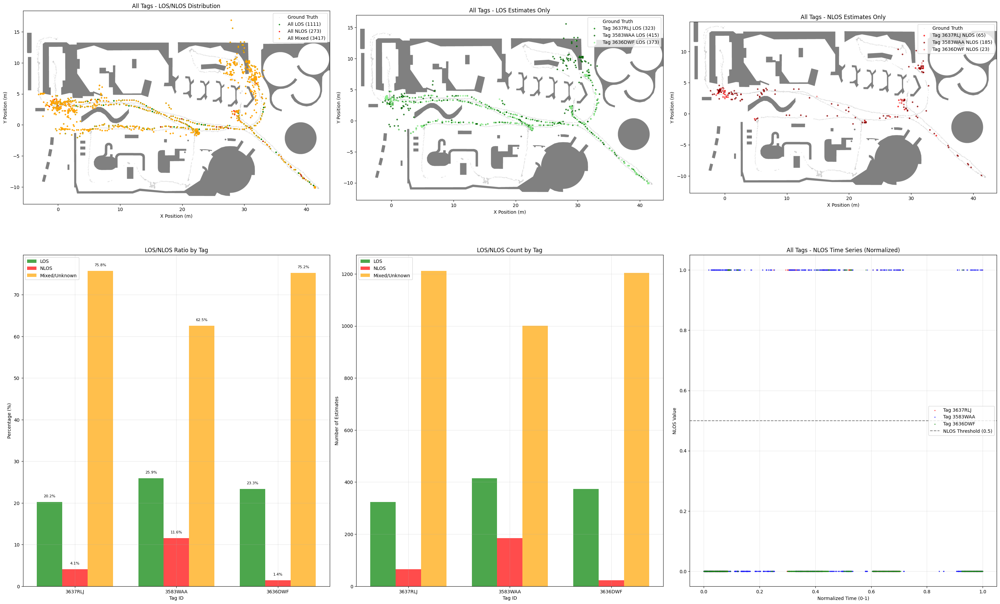

✓ 全タグLOS/NLOS比較図を保存: plots/tag_los_nlos_analysis/all_tags_los_nlos_comparison.png

📊 全タグLOS/NLOS統計サマリー:
--------------------------------------------------
Tag 3637RLJ:
  LOS: 323 (20.2%)
  NLOS: 65 (4.1%)
  Mixed: 1212 (75.8%)

Tag 3583WAA:
  LOS: 415 (25.9%)
  NLOS: 185 (11.6%)
  Mixed: 1001 (62.5%)

Tag 3636DWF:
  LOS: 373 (23.3%)
  NLOS: 23 (1.4%)
  Mixed: 1204 (75.2%)

全体統計:
  総LOS: 1111 (23.1%)
  総NLOS: 273 (5.7%)
  総Mixed: 3417 (71.2%)


In [80]:
# 全タグのLOS/NLOS比較プロット
def plot_all_tags_los_nlos_comparison(real_tag_estimates, df_uwbt, df_gt, available_tags, nlos_threshold=0.5):
    """
    全タグのLOS/NLOS状態を一度に比較するプロット
    """
    output_dir = "plots/tag_los_nlos_analysis"
    os.makedirs(output_dir, exist_ok=True)
    
    print("\n" + "=" * 60)
    print("全タグLOS/NLOS比較分析")
    print("=" * 60)
    
    # 各タグのLOS/NLOS統計を収集
    tag_los_nlos_stats = {}
    all_los_estimates = []
    all_nlos_estimates = []
    all_mixed_estimates = []
    
    for tag_id in available_tags:
        if len(real_tag_estimates[tag_id]) == 0:
            continue
            
        tag_data = real_tag_estimates[tag_id]
        tag_uwbt = df_uwbt[df_uwbt['tag_id'] == tag_id].copy()
        
        if len(tag_uwbt) == 0:
            continue
        
        los_estimates = []
        nlos_estimates = []
        mixed_estimates = []
        
        for _, est_row in tag_data.iterrows():
            est_time = est_row['timestamp']
            time_mask = (tag_uwbt['app_timestamp'] >= est_time - 0.1) & \
                       (tag_uwbt['app_timestamp'] <= est_time + 0.1)
            nearby_uwbt = tag_uwbt[time_mask]
            
            if len(nearby_uwbt) > 0:
                nlos_ratio = (nearby_uwbt['nlos'] > nlos_threshold).mean()
                est_row_with_tag = est_row.copy()
                est_row_with_tag['tag_id'] = tag_id
                
                if nlos_ratio < 0.3:
                    los_estimates.append(est_row_with_tag)
                    all_los_estimates.append(est_row_with_tag)
                elif nlos_ratio > 0.7:
                    nlos_estimates.append(est_row_with_tag)
                    all_nlos_estimates.append(est_row_with_tag)
                else:
                    mixed_estimates.append(est_row_with_tag)
                    all_mixed_estimates.append(est_row_with_tag)
            else:
                est_row_with_tag = est_row.copy()
                est_row_with_tag['tag_id'] = tag_id
                mixed_estimates.append(est_row_with_tag)
                all_mixed_estimates.append(est_row_with_tag)
        
        tag_los_nlos_stats[tag_id] = {
            'los_count': len(los_estimates),
            'nlos_count': len(nlos_estimates),
            'mixed_count': len(mixed_estimates),
            'total_count': len(tag_data),
            'los_ratio': len(los_estimates) / len(tag_data) * 100,
            'nlos_ratio': len(nlos_estimates) / len(tag_data) * 100,
            'mixed_ratio': len(mixed_estimates) / len(tag_data) * 100
        }
    
    # データフレーム作成
    df_all_los = pd.DataFrame(all_los_estimates)
    df_all_nlos = pd.DataFrame(all_nlos_estimates)
    df_all_mixed = pd.DataFrame(all_mixed_estimates)
    
    # 2x3のサブプロット作成
    fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(30, 20))
    
    # 1. 全タグLOS/NLOS統合ビュー
    plot_map(ax1, bitmap_array, map_origin, map_ppm)
    ax1.scatter(df_gt.x, df_gt.y, c='lightgray', s=1, alpha=0.3, label="Ground Truth")
    
    if len(df_all_los) > 0:
        ax1.scatter(df_all_los.x, df_all_los.y, c='green', s=4, alpha=0.8, label=f"All LOS ({len(df_all_los)})")
    if len(df_all_nlos) > 0:
        ax1.scatter(df_all_nlos.x, df_all_nlos.y, c='red', s=4, alpha=0.8, label=f"All NLOS ({len(df_all_nlos)})")
    if len(df_all_mixed) > 0:
        ax1.scatter(df_all_mixed.x, df_all_mixed.y, c='orange', s=4, alpha=0.8, label=f"All Mixed ({len(df_all_mixed)})")
    
    ax1.set_xlabel("X Position (m)")
    ax1.set_ylabel("Y Position (m)")
    ax1.legend()
    ax1.set_title("All Tags - LOS/NLOS Distribution")
    
    # 2. タグ別LOS推定のみ
    plot_map(ax2, bitmap_array, map_origin, map_ppm)
    ax2.scatter(df_gt.x, df_gt.y, c='lightgray', s=1, alpha=0.3, label="Ground Truth")
    
    colors = ['green', 'darkgreen', 'lightgreen', 'forestgreen', 'limegreen']
    for i, tag_id in enumerate(available_tags):
        tag_los = df_all_los[df_all_los['tag_id'] == tag_id] if len(df_all_los) > 0 else pd.DataFrame()
        if len(tag_los) > 0:
            color = colors[i % len(colors)]
            ax2.scatter(tag_los.x, tag_los.y, c=color, s=6, alpha=0.7, label=f"Tag {tag_id} LOS ({len(tag_los)})")
    
    ax2.set_xlabel("X Position (m)")
    ax2.set_ylabel("Y Position (m)")
    ax2.legend()
    ax2.set_title("All Tags - LOS Estimates Only")
    
    # 3. タグ別NLOS推定のみ
    plot_map(ax3, bitmap_array, map_origin, map_ppm)
    ax3.scatter(df_gt.x, df_gt.y, c='lightgray', s=1, alpha=0.3, label="Ground Truth")
    
    colors = ['red', 'darkred', 'lightcoral', 'crimson', 'indianred']
    for i, tag_id in enumerate(available_tags):
        tag_nlos = df_all_nlos[df_all_nlos['tag_id'] == tag_id] if len(df_all_nlos) > 0 else pd.DataFrame()
        if len(tag_nlos) > 0:
            color = colors[i % len(colors)]
            ax3.scatter(tag_nlos.x, tag_nlos.y, c=color, s=6, alpha=0.7, label=f"Tag {tag_id} NLOS ({len(tag_nlos)})")
    
    ax3.set_xlabel("X Position (m)")
    ax3.set_ylabel("Y Position (m)")
    ax3.legend()
    ax3.set_title("All Tags - NLOS Estimates Only")
    
    # 4. LOS/NLOS比率の棒グラフ
    tag_names = list(tag_los_nlos_stats.keys())
    los_ratios = [tag_los_nlos_stats[tag]['los_ratio'] for tag in tag_names]
    nlos_ratios = [tag_los_nlos_stats[tag]['nlos_ratio'] for tag in tag_names]
    mixed_ratios = [tag_los_nlos_stats[tag]['mixed_ratio'] for tag in tag_names]
    
    x_pos = np.arange(len(tag_names))
    width = 0.25
    
    ax4.bar(x_pos - width, los_ratios, width, label='LOS', color='green', alpha=0.7)
    ax4.bar(x_pos, nlos_ratios, width, label='NLOS', color='red', alpha=0.7)
    ax4.bar(x_pos + width, mixed_ratios, width, label='Mixed/Unknown', color='orange', alpha=0.7)
    
    ax4.set_xlabel('Tag ID')
    ax4.set_ylabel('Percentage (%)')
    ax4.set_title('LOS/NLOS Ratio by Tag')
    ax4.set_xticks(x_pos)
    ax4.set_xticklabels(tag_names)
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    
    # 棒グラフに値を表示
    for i, (los, nlos, mixed) in enumerate(zip(los_ratios, nlos_ratios, mixed_ratios)):
        ax4.text(i - width, los + 1, f'{los:.1f}%', ha='center', va='bottom', fontsize=8)
        ax4.text(i, nlos + 1, f'{nlos:.1f}%', ha='center', va='bottom', fontsize=8)
        ax4.text(i + width, mixed + 1, f'{mixed:.1f}%', ha='center', va='bottom', fontsize=8)
    
    # 5. データ数の棒グラフ
    los_counts = [tag_los_nlos_stats[tag]['los_count'] for tag in tag_names]
    nlos_counts = [tag_los_nlos_stats[tag]['nlos_count'] for tag in tag_names]
    mixed_counts = [tag_los_nlos_stats[tag]['mixed_count'] for tag in tag_names]
    
    ax5.bar(x_pos - width, los_counts, width, label='LOS', color='green', alpha=0.7)
    ax5.bar(x_pos, nlos_counts, width, label='NLOS', color='red', alpha=0.7)
    ax5.bar(x_pos + width, mixed_counts, width, label='Mixed/Unknown', color='orange', alpha=0.7)
    
    ax5.set_xlabel('Tag ID')
    ax5.set_ylabel('Number of Estimates')
    ax5.set_title('LOS/NLOS Count by Tag')
    ax5.set_xticks(x_pos)
    ax5.set_xticklabels(tag_names)
    ax5.legend()
    ax5.grid(True, alpha=0.3)
    
    # 6. 各タグのNLOS時系列サマリー
    for i, tag_id in enumerate(available_tags):
        tag_uwbt = df_uwbt[df_uwbt['tag_id'] == tag_id].copy()
        if len(tag_uwbt) > 0:
            # 時間を正規化（0-1）
            time_normalized = (tag_uwbt['app_timestamp'] - tag_uwbt['app_timestamp'].min()) / \
                            (tag_uwbt['app_timestamp'].max() - tag_uwbt['app_timestamp'].min())
            
            colors_ts = ['red', 'blue', 'green', 'orange', 'purple']
            color = colors_ts[i % len(colors_ts)]
            
            ax6.scatter(time_normalized, tag_uwbt['nlos'], 
                       c=color, s=2, alpha=0.6, label=f'Tag {tag_id}')
    
    ax6.axhline(y=nlos_threshold, color='black', linestyle='--', alpha=0.5, 
               label=f'NLOS Threshold ({nlos_threshold})')
    ax6.set_xlabel("Normalized Time (0-1)")
    ax6.set_ylabel("NLOS Value")
    ax6.set_title("All Tags - NLOS Time Series (Normalized)")
    ax6.legend()
    ax6.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    # 図を保存
    filename = f"{output_dir}/all_tags_los_nlos_comparison.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"✓ 全タグLOS/NLOS比較図を保存: {filename}")
    
    # 統計サマリー表示
    print(f"\n📊 全タグLOS/NLOS統計サマリー:")
    print("-" * 50)
    for tag_id, stats in tag_los_nlos_stats.items():
        print(f"Tag {tag_id}:")
        print(f"  LOS: {stats['los_count']} ({stats['los_ratio']:.1f}%)")
        print(f"  NLOS: {stats['nlos_count']} ({stats['nlos_ratio']:.1f}%)")
        print(f"  Mixed: {stats['mixed_count']} ({stats['mixed_ratio']:.1f}%)")
        print()
    
    total_los = sum(stats['los_count'] for stats in tag_los_nlos_stats.values())
    total_nlos = sum(stats['nlos_count'] for stats in tag_los_nlos_stats.values())
    total_mixed = sum(stats['mixed_count'] for stats in tag_los_nlos_stats.values())
    total_all = total_los + total_nlos + total_mixed
    
    print("全体統計:")
    print(f"  総LOS: {total_los} ({total_los/total_all*100:.1f}%)")
    print(f"  総NLOS: {total_nlos} ({total_nlos/total_all*100:.1f}%)")
    print(f"  総Mixed: {total_mixed} ({total_mixed/total_all*100:.1f}%)")
    
    plt.close(fig)

# 全タグLOS/NLOS比較プロット実行
plot_all_tags_los_nlos_comparison(real_tag_estimates, df_uwbt, df_gt, available_tags)